In [1]:
# beware CUDA (mostly works by toggling the device parameter throughout)
# This script loads games that have been trained for communication, then runs and saves communication for all available agent pairs
from egg.zoo.pop.games import build_game
from egg.zoo.pop.utils import load_from_checkpoint

# import sys
import pathlib
import numpy as np # :( is it really needed ??

#drawing and plotting
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec

# import glob
import torch
from egg.core.batch import Batch
from egg.core.interaction import Interaction
from egg.zoo.pop.data import get_dataloader
from egg.zoo.pop.utils import get_common_opts, metadata_opener, path_to_parameters

# PCA
from sklearn.decomposition import PCA
from matplotlib.offsetbox import (OffsetImage, AnnotationBbox)
import pandas as pd
from sklearn.cluster import KMeans



/homedtcl/mmahaut/.conda/envs/omelette/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def eval(
    sender,
    sender_input,
    device="cuda",
):
    """
    For a sender show all images with their corresponding saliency map
    """
    messages = sender(sender_input.to(device), {})
    sender.zero_grad()
    messages.mean().backward()
    saliencies = [torch.max(sender_input.grad[i].data.abs().to("cpu"), dim=0) for i in range(len(messages))]
    return messages.detach().to("cpu"), saliencies

def display_saliency_and_image(image, saliency):
    # Visualize the image and the saliency map
    # TODO : colour differences might be relevant to take into account
    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(image.cpu().detach().numpy().transpose(1, 2, 0))
    ax[0].axis('off')
    ax[1].imshow(saliency, cmap='hot')
    ax[1].axis('off')
    plt.tight_layout()
    fig.suptitle('The Image and Its Saliency Map')
    plt.show()

def display_saliency(image, saliency):
    # Visualize the saliency map
    # TODO : colour differences might be relevant to take into account
    fig, ax = plt.subplots(1, 1)
    ax.imshow(saliency, cmap='hot')
    ax.axis('off')
    plt.tight_layout()
    plt.show()
    
def get_models(path):
    # get senders and receivers trained and saved at a given path
    f = open(path_to_parameters(path, "wandb"))
    opts = get_common_opts(metadata_opener(f, data_type="wandb", verbose=True))
    pop_game = build_game(opts)
    load_from_checkpoint(pop_game, path)
    return pop_game.agents_loss_sampler.senders, pop_game.agents_loss_sampler.receivers

def reset_dataloader(opts, batch_size=None):
    _, train_loader = get_dataloader(
        dataset_dir=opts.dataset_dir,
        dataset_name=opts.dataset_name,
        image_size=opts.image_size,
        batch_size=batch_size if batch_size is not None else opts.batch_size,
        num_workers=0,
        is_distributed=opts.distributed_context.is_distributed,
        seed=111,  # same as hardcoded version used in experiments
        use_augmentations=opts.use_augmentations,
        return_original_image=opts.return_original_image,
        split_set=True,
        augmentation_type=opts.augmentation_type,
        is_single_class_batch=opts.is_single_class_batch,
    )
    return train_loader

In [29]:
# saliency from any model for a specific message
device = "cuda"
model_paths = ["/homedtcl/mmahaut/projects/experiments/im1k_cont/212452/final.tar"]
senders = [get_models(path)[0] for path in model_paths]
# add a control to check they all have the same data 
# temp solution this is suboptimal, I already got all the opts when getting the sender
f = open(path_to_parameters(model_paths[0], "wandb"))
opts = get_common_opts(metadata_opener(f, data_type="wandb", verbose=True))
    
dataloader = reset_dataloader(opts, 2)
messages = []
saliencies = []
labels = []
for s_idx, sender in enumerate(senders[0]):
    sender = sender.to(device)
    for batch in dataloader:
        sender_input = batch[0].requires_grad_()
        message, saliency = eval(sender,sender_input)
        saliencies.append(saliency)
        messages.append(message)
        labels.append(batch[1])
        if len(messages) >= (s_idx +1)* 5000:
            break
    # remove the following break if you want messages from different senders
    break
print(len(messages))
# saliencies = np.concatenate(saliencies)
# messages = np.concatenate(messages)
# messages = np.concatenate(labels)

initialize module vit
initialize module inception


/homedtcl/mmahaut/.conda/envs/omelette/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/homedtcl/mmahaut/.conda/envs/omelette/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


initialize module dino
initialize module swin
initialize module resnet152


/homedtcl/mmahaut/.conda/envs/omelette/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


initialize module vgg11


/homedtcl/mmahaut/.conda/envs/omelette/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG11_Weights.IMAGENET1K_V1`. You can also use `weights=VGG11_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


['vgg11', 'vit', 'resnet152', 'inception', 'dino', 'swin']
['vgg11', 'vit', 'resnet152', 'inception', 'dino', 'swin']
# loading trainer state from /homedtcl/mmahaut/projects/experiments/bigger_disc/260603/final.tar


RuntimeError: Error(s) in loading state_dict for PopulationGame:
	Missing key(s) in state_dict: "agents_loss_sampler.senders.0.vision_module.features.0.weight", "agents_loss_sampler.senders.0.vision_module.features.0.bias", "agents_loss_sampler.senders.0.vision_module.features.3.weight", "agents_loss_sampler.senders.0.vision_module.features.3.bias", "agents_loss_sampler.senders.0.vision_module.features.6.weight", "agents_loss_sampler.senders.0.vision_module.features.6.bias", "agents_loss_sampler.senders.0.vision_module.features.8.weight", "agents_loss_sampler.senders.0.vision_module.features.8.bias", "agents_loss_sampler.senders.0.vision_module.features.11.weight", "agents_loss_sampler.senders.0.vision_module.features.11.bias", "agents_loss_sampler.senders.0.vision_module.features.13.weight", "agents_loss_sampler.senders.0.vision_module.features.13.bias", "agents_loss_sampler.senders.0.vision_module.features.16.weight", "agents_loss_sampler.senders.0.vision_module.features.16.bias", "agents_loss_sampler.senders.0.vision_module.features.18.weight", "agents_loss_sampler.senders.0.vision_module.features.18.bias", "agents_loss_sampler.senders.0.vision_module.classifier.0.weight", "agents_loss_sampler.senders.0.vision_module.classifier.0.bias", "agents_loss_sampler.senders.0.vision_module.classifier.3.weight", "agents_loss_sampler.senders.0.vision_module.classifier.3.bias", "agents_loss_sampler.senders.0.fc.0.weight", "agents_loss_sampler.senders.0.fc.0.bias", "agents_loss_sampler.senders.0.fc.1.weight", "agents_loss_sampler.senders.0.fc.1.bias", "agents_loss_sampler.senders.0.fc.1.running_mean", "agents_loss_sampler.senders.0.fc.1.running_var", "agents_loss_sampler.senders.1.vision_module.cls_token", "agents_loss_sampler.senders.1.vision_module.pos_embed", "agents_loss_sampler.senders.1.vision_module.patch_embed.proj.weight", "agents_loss_sampler.senders.1.vision_module.patch_embed.proj.bias", "agents_loss_sampler.senders.1.vision_module.blocks.0.norm1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.0.norm1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.0.attn.qkv.weight", "agents_loss_sampler.senders.1.vision_module.blocks.0.attn.qkv.bias", "agents_loss_sampler.senders.1.vision_module.blocks.0.attn.proj.weight", "agents_loss_sampler.senders.1.vision_module.blocks.0.attn.proj.bias", "agents_loss_sampler.senders.1.vision_module.blocks.0.norm2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.0.norm2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.0.mlp.fc1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.0.mlp.fc1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.0.mlp.fc2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.0.mlp.fc2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.1.norm1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.1.norm1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.1.attn.qkv.weight", "agents_loss_sampler.senders.1.vision_module.blocks.1.attn.qkv.bias", "agents_loss_sampler.senders.1.vision_module.blocks.1.attn.proj.weight", "agents_loss_sampler.senders.1.vision_module.blocks.1.attn.proj.bias", "agents_loss_sampler.senders.1.vision_module.blocks.1.norm2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.1.norm2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.1.mlp.fc1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.1.mlp.fc1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.1.mlp.fc2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.1.mlp.fc2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.2.norm1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.2.norm1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.2.attn.qkv.weight", "agents_loss_sampler.senders.1.vision_module.blocks.2.attn.qkv.bias", "agents_loss_sampler.senders.1.vision_module.blocks.2.attn.proj.weight", "agents_loss_sampler.senders.1.vision_module.blocks.2.attn.proj.bias", "agents_loss_sampler.senders.1.vision_module.blocks.2.norm2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.2.norm2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.2.mlp.fc1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.2.mlp.fc1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.2.mlp.fc2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.2.mlp.fc2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.3.norm1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.3.norm1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.3.attn.qkv.weight", "agents_loss_sampler.senders.1.vision_module.blocks.3.attn.qkv.bias", "agents_loss_sampler.senders.1.vision_module.blocks.3.attn.proj.weight", "agents_loss_sampler.senders.1.vision_module.blocks.3.attn.proj.bias", "agents_loss_sampler.senders.1.vision_module.blocks.3.norm2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.3.norm2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.3.mlp.fc1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.3.mlp.fc1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.3.mlp.fc2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.3.mlp.fc2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.4.norm1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.4.norm1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.4.attn.qkv.weight", "agents_loss_sampler.senders.1.vision_module.blocks.4.attn.qkv.bias", "agents_loss_sampler.senders.1.vision_module.blocks.4.attn.proj.weight", "agents_loss_sampler.senders.1.vision_module.blocks.4.attn.proj.bias", "agents_loss_sampler.senders.1.vision_module.blocks.4.norm2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.4.norm2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.4.mlp.fc1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.4.mlp.fc1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.4.mlp.fc2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.4.mlp.fc2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.5.norm1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.5.norm1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.5.attn.qkv.weight", "agents_loss_sampler.senders.1.vision_module.blocks.5.attn.qkv.bias", "agents_loss_sampler.senders.1.vision_module.blocks.5.attn.proj.weight", "agents_loss_sampler.senders.1.vision_module.blocks.5.attn.proj.bias", "agents_loss_sampler.senders.1.vision_module.blocks.5.norm2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.5.norm2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.5.mlp.fc1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.5.mlp.fc1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.5.mlp.fc2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.5.mlp.fc2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.6.norm1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.6.norm1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.6.attn.qkv.weight", "agents_loss_sampler.senders.1.vision_module.blocks.6.attn.qkv.bias", "agents_loss_sampler.senders.1.vision_module.blocks.6.attn.proj.weight", "agents_loss_sampler.senders.1.vision_module.blocks.6.attn.proj.bias", "agents_loss_sampler.senders.1.vision_module.blocks.6.norm2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.6.norm2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.6.mlp.fc1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.6.mlp.fc1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.6.mlp.fc2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.6.mlp.fc2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.7.norm1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.7.norm1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.7.attn.qkv.weight", "agents_loss_sampler.senders.1.vision_module.blocks.7.attn.qkv.bias", "agents_loss_sampler.senders.1.vision_module.blocks.7.attn.proj.weight", "agents_loss_sampler.senders.1.vision_module.blocks.7.attn.proj.bias", "agents_loss_sampler.senders.1.vision_module.blocks.7.norm2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.7.norm2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.7.mlp.fc1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.7.mlp.fc1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.7.mlp.fc2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.7.mlp.fc2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.8.norm1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.8.norm1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.8.attn.qkv.weight", "agents_loss_sampler.senders.1.vision_module.blocks.8.attn.qkv.bias", "agents_loss_sampler.senders.1.vision_module.blocks.8.attn.proj.weight", "agents_loss_sampler.senders.1.vision_module.blocks.8.attn.proj.bias", "agents_loss_sampler.senders.1.vision_module.blocks.8.norm2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.8.norm2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.8.mlp.fc1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.8.mlp.fc1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.8.mlp.fc2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.8.mlp.fc2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.9.norm1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.9.norm1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.9.attn.qkv.weight", "agents_loss_sampler.senders.1.vision_module.blocks.9.attn.qkv.bias", "agents_loss_sampler.senders.1.vision_module.blocks.9.attn.proj.weight", "agents_loss_sampler.senders.1.vision_module.blocks.9.attn.proj.bias", "agents_loss_sampler.senders.1.vision_module.blocks.9.norm2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.9.norm2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.9.mlp.fc1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.9.mlp.fc1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.9.mlp.fc2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.9.mlp.fc2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.10.norm1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.10.norm1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.10.attn.qkv.weight", "agents_loss_sampler.senders.1.vision_module.blocks.10.attn.qkv.bias", "agents_loss_sampler.senders.1.vision_module.blocks.10.attn.proj.weight", "agents_loss_sampler.senders.1.vision_module.blocks.10.attn.proj.bias", "agents_loss_sampler.senders.1.vision_module.blocks.10.norm2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.10.norm2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.10.mlp.fc1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.10.mlp.fc1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.10.mlp.fc2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.10.mlp.fc2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.11.norm1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.11.norm1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.11.attn.qkv.weight", "agents_loss_sampler.senders.1.vision_module.blocks.11.attn.qkv.bias", "agents_loss_sampler.senders.1.vision_module.blocks.11.attn.proj.weight", "agents_loss_sampler.senders.1.vision_module.blocks.11.attn.proj.bias", "agents_loss_sampler.senders.1.vision_module.blocks.11.norm2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.11.norm2.bias", "agents_loss_sampler.senders.1.vision_module.blocks.11.mlp.fc1.weight", "agents_loss_sampler.senders.1.vision_module.blocks.11.mlp.fc1.bias", "agents_loss_sampler.senders.1.vision_module.blocks.11.mlp.fc2.weight", "agents_loss_sampler.senders.1.vision_module.blocks.11.mlp.fc2.bias", "agents_loss_sampler.senders.1.vision_module.norm.weight", "agents_loss_sampler.senders.1.vision_module.norm.bias", "agents_loss_sampler.senders.1.fc.0.weight", "agents_loss_sampler.senders.1.fc.0.bias", "agents_loss_sampler.senders.1.fc.1.weight", "agents_loss_sampler.senders.1.fc.1.bias", "agents_loss_sampler.senders.1.fc.1.running_mean", "agents_loss_sampler.senders.1.fc.1.running_var", "agents_loss_sampler.senders.2.vision_module.conv1.weight", "agents_loss_sampler.senders.2.vision_module.bn1.weight", "agents_loss_sampler.senders.2.vision_module.bn1.bias", "agents_loss_sampler.senders.2.vision_module.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer1.0.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer1.0.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer1.0.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer1.0.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer1.0.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer1.0.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer1.0.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer1.0.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer1.0.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer1.0.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer1.0.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer1.0.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer1.0.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer1.0.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer1.0.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer1.0.downsample.0.weight", "agents_loss_sampler.senders.2.vision_module.layer1.0.downsample.1.weight", "agents_loss_sampler.senders.2.vision_module.layer1.0.downsample.1.bias", "agents_loss_sampler.senders.2.vision_module.layer1.0.downsample.1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer1.0.downsample.1.running_var", "agents_loss_sampler.senders.2.vision_module.layer1.1.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer1.1.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer1.1.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer1.1.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer1.1.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer1.1.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer1.1.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer1.1.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer1.1.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer1.1.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer1.1.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer1.1.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer1.1.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer1.1.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer1.1.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer1.2.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer1.2.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer1.2.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer1.2.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer1.2.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer1.2.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer1.2.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer1.2.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer1.2.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer1.2.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer1.2.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer1.2.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer1.2.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer1.2.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer1.2.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.0.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.0.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.0.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer2.0.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.0.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.0.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.0.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.0.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer2.0.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.0.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.0.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.0.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.0.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer2.0.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.0.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.0.downsample.0.weight", "agents_loss_sampler.senders.2.vision_module.layer2.0.downsample.1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.0.downsample.1.bias", "agents_loss_sampler.senders.2.vision_module.layer2.0.downsample.1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.0.downsample.1.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.1.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.1.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.1.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer2.1.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.1.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.1.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.1.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.1.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer2.1.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.1.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.1.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.1.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.1.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer2.1.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.1.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.2.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.2.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.2.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer2.2.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.2.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.2.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.2.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.2.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer2.2.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.2.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.2.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.2.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.2.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer2.2.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.2.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.3.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.3.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.3.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer2.3.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.3.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.3.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.3.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.3.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer2.3.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.3.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.3.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.3.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.3.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer2.3.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.3.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.4.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.4.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.4.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer2.4.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.4.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.4.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.4.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.4.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer2.4.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.4.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.4.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.4.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.4.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer2.4.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.4.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.5.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.5.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.5.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer2.5.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.5.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.5.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.5.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.5.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer2.5.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.5.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.5.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.5.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.5.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer2.5.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.5.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.6.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.6.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.6.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer2.6.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.6.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.6.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.6.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.6.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer2.6.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.6.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.6.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.6.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.6.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer2.6.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.6.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.7.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.7.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer2.7.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer2.7.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.7.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.7.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.7.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer2.7.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer2.7.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.7.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer2.7.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.7.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer2.7.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer2.7.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer2.7.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.0.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.0.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.0.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.0.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.0.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.0.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.0.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.0.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.0.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.0.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.0.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.0.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.0.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.0.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.0.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.0.downsample.0.weight", "agents_loss_sampler.senders.2.vision_module.layer3.0.downsample.1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.0.downsample.1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.0.downsample.1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.0.downsample.1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.1.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.1.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.1.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.1.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.1.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.1.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.1.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.1.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.1.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.1.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.1.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.1.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.1.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.1.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.1.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.2.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.2.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.2.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.2.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.2.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.2.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.2.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.2.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.2.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.2.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.2.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.2.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.2.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.2.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.2.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.3.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.3.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.3.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.3.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.3.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.3.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.3.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.3.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.3.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.3.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.3.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.3.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.3.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.3.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.3.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.4.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.4.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.4.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.4.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.4.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.4.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.4.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.4.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.4.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.4.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.4.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.4.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.4.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.4.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.4.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.5.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.5.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.5.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.5.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.5.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.5.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.5.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.5.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.5.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.5.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.5.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.5.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.5.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.5.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.5.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.6.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.6.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.6.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.6.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.6.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.6.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.6.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.6.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.6.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.6.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.6.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.6.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.6.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.6.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.6.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.7.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.7.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.7.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.7.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.7.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.7.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.7.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.7.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.7.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.7.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.7.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.7.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.7.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.7.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.7.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.8.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.8.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.8.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.8.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.8.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.8.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.8.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.8.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.8.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.8.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.8.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.8.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.8.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.8.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.8.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.9.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.9.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.9.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.9.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.9.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.9.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.9.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.9.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.9.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.9.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.9.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.9.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.9.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.9.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.9.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.10.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.10.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.10.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.10.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.10.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.10.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.10.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.10.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.10.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.10.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.10.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.10.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.10.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.10.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.10.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.11.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.11.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.11.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.11.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.11.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.11.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.11.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.11.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.11.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.11.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.11.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.11.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.11.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.11.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.11.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.12.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.12.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.12.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.12.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.12.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.12.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.12.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.12.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.12.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.12.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.12.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.12.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.12.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.12.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.12.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.13.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.13.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.13.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.13.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.13.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.13.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.13.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.13.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.13.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.13.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.13.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.13.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.13.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.13.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.13.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.14.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.14.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.14.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.14.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.14.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.14.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.14.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.14.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.14.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.14.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.14.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.14.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.14.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.14.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.14.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.15.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.15.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.15.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.15.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.15.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.15.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.15.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.15.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.15.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.15.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.15.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.15.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.15.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.15.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.15.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.16.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.16.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.16.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.16.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.16.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.16.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.16.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.16.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.16.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.16.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.16.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.16.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.16.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.16.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.16.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.17.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.17.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.17.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.17.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.17.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.17.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.17.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.17.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.17.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.17.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.17.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.17.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.17.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.17.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.17.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.18.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.18.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.18.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.18.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.18.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.18.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.18.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.18.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.18.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.18.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.18.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.18.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.18.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.18.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.18.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.19.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.19.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.19.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.19.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.19.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.19.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.19.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.19.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.19.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.19.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.19.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.19.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.19.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.19.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.19.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.20.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.20.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.20.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.20.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.20.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.20.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.20.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.20.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.20.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.20.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.20.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.20.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.20.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.20.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.20.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.21.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.21.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.21.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.21.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.21.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.21.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.21.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.21.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.21.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.21.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.21.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.21.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.21.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.21.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.21.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.22.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.22.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.22.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.22.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.22.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.22.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.22.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.22.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.22.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.22.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.22.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.22.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.22.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.22.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.22.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.23.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.23.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.23.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.23.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.23.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.23.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.23.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.23.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.23.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.23.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.23.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.23.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.23.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.23.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.23.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.24.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.24.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.24.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.24.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.24.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.24.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.24.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.24.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.24.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.24.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.24.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.24.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.24.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.24.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.24.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.25.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.25.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.25.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.25.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.25.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.25.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.25.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.25.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.25.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.25.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.25.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.25.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.25.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.25.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.25.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.26.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.26.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.26.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.26.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.26.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.26.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.26.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.26.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.26.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.26.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.26.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.26.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.26.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.26.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.26.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.27.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.27.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.27.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.27.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.27.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.27.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.27.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.27.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.27.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.27.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.27.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.27.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.27.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.27.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.27.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.28.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.28.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.28.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.28.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.28.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.28.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.28.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.28.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.28.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.28.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.28.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.28.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.28.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.28.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.28.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.29.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.29.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.29.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.29.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.29.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.29.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.29.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.29.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.29.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.29.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.29.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.29.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.29.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.29.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.29.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.30.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.30.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.30.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.30.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.30.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.30.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.30.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.30.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.30.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.30.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.30.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.30.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.30.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.30.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.30.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.31.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.31.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.31.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.31.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.31.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.31.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.31.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.31.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.31.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.31.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.31.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.31.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.31.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.31.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.31.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.32.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.32.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.32.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.32.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.32.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.32.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.32.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.32.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.32.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.32.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.32.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.32.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.32.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.32.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.32.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.33.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.33.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.33.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.33.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.33.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.33.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.33.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.33.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.33.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.33.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.33.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.33.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.33.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.33.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.33.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.34.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.34.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.34.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.34.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.34.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.34.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.34.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.34.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.34.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.34.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.34.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.34.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.34.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.34.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.34.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.35.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.35.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer3.35.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer3.35.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.35.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.35.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.35.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer3.35.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer3.35.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.35.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer3.35.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.35.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer3.35.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer3.35.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer3.35.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer4.0.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer4.0.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer4.0.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer4.0.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer4.0.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer4.0.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer4.0.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer4.0.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer4.0.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer4.0.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer4.0.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer4.0.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer4.0.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer4.0.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer4.0.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer4.0.downsample.0.weight", "agents_loss_sampler.senders.2.vision_module.layer4.0.downsample.1.weight", "agents_loss_sampler.senders.2.vision_module.layer4.0.downsample.1.bias", "agents_loss_sampler.senders.2.vision_module.layer4.0.downsample.1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer4.0.downsample.1.running_var", "agents_loss_sampler.senders.2.vision_module.layer4.1.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer4.1.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer4.1.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer4.1.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer4.1.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer4.1.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer4.1.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer4.1.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer4.1.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer4.1.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer4.1.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer4.1.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer4.1.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer4.1.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer4.1.bn3.running_var", "agents_loss_sampler.senders.2.vision_module.layer4.2.conv1.weight", "agents_loss_sampler.senders.2.vision_module.layer4.2.bn1.weight", "agents_loss_sampler.senders.2.vision_module.layer4.2.bn1.bias", "agents_loss_sampler.senders.2.vision_module.layer4.2.bn1.running_mean", "agents_loss_sampler.senders.2.vision_module.layer4.2.bn1.running_var", "agents_loss_sampler.senders.2.vision_module.layer4.2.conv2.weight", "agents_loss_sampler.senders.2.vision_module.layer4.2.bn2.weight", "agents_loss_sampler.senders.2.vision_module.layer4.2.bn2.bias", "agents_loss_sampler.senders.2.vision_module.layer4.2.bn2.running_mean", "agents_loss_sampler.senders.2.vision_module.layer4.2.bn2.running_var", "agents_loss_sampler.senders.2.vision_module.layer4.2.conv3.weight", "agents_loss_sampler.senders.2.vision_module.layer4.2.bn3.weight", "agents_loss_sampler.senders.2.vision_module.layer4.2.bn3.bias", "agents_loss_sampler.senders.2.vision_module.layer4.2.bn3.running_mean", "agents_loss_sampler.senders.2.vision_module.layer4.2.bn3.running_var", "agents_loss_sampler.senders.2.fc.0.weight", "agents_loss_sampler.senders.2.fc.0.bias", "agents_loss_sampler.senders.2.fc.1.weight", "agents_loss_sampler.senders.2.fc.1.bias", "agents_loss_sampler.senders.2.fc.1.running_mean", "agents_loss_sampler.senders.2.fc.1.running_var", "agents_loss_sampler.senders.3.vision_module.Conv2d_1a_3x3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Conv2d_1a_3x3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Conv2d_1a_3x3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Conv2d_1a_3x3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Conv2d_1a_3x3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Conv2d_2a_3x3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Conv2d_2a_3x3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Conv2d_2a_3x3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Conv2d_2a_3x3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Conv2d_2a_3x3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Conv2d_2b_3x3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Conv2d_2b_3x3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Conv2d_2b_3x3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Conv2d_2b_3x3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Conv2d_2b_3x3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Conv2d_3b_1x1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Conv2d_3b_1x1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Conv2d_3b_1x1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Conv2d_3b_1x1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Conv2d_3b_1x1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Conv2d_4a_3x3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Conv2d_4a_3x3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Conv2d_4a_3x3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Conv2d_4a_3x3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Conv2d_4a_3x3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch1x1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch1x1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch1x1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch5x5_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch5x5_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch5x5_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch5x5_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch5x5_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch5x5_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch5x5_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch5x5_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch5x5_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch5x5_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch_pool.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch_pool.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch_pool.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5b.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch1x1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch1x1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch1x1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch5x5_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch5x5_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch5x5_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch5x5_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch5x5_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch5x5_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch5x5_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch5x5_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch5x5_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch5x5_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch_pool.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch_pool.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch_pool.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5c.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch1x1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch1x1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch1x1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch5x5_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch5x5_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch5x5_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch5x5_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch5x5_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch5x5_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch5x5_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch5x5_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch5x5_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch5x5_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch_pool.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch_pool.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch_pool.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_5d.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6a.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch1x1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch1x1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch1x1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7_3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_4.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_4.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_4.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_5.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_5.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_5.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch_pool.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch_pool.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch_pool.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6b.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch1x1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch1x1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch1x1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7_3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_4.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_4.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_4.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_5.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_5.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_5.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch_pool.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch_pool.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch_pool.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6c.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch1x1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch1x1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch1x1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7_3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_4.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_4.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_4.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_5.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_5.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_5.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch_pool.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch_pool.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch_pool.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6d.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch1x1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch1x1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch1x1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7_3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_4.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_4.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_4.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_5.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_5.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_5.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch_pool.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch_pool.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch_pool.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_6e.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.vision_module.AuxLogits.conv0.conv.weight", "agents_loss_sampler.senders.3.vision_module.AuxLogits.conv0.bn.weight", "agents_loss_sampler.senders.3.vision_module.AuxLogits.conv0.bn.bias", "agents_loss_sampler.senders.3.vision_module.AuxLogits.conv0.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.AuxLogits.conv0.bn.running_var", "agents_loss_sampler.senders.3.vision_module.AuxLogits.conv1.conv.weight", "agents_loss_sampler.senders.3.vision_module.AuxLogits.conv1.bn.weight", "agents_loss_sampler.senders.3.vision_module.AuxLogits.conv1.bn.bias", "agents_loss_sampler.senders.3.vision_module.AuxLogits.conv1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.AuxLogits.conv1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch3x3_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch3x3_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch3x3_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch3x3_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch3x3_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch3x3_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch3x3_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch3x3_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch3x3_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch3x3_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_3.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_3.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_3.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_3.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_3.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_4.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_4.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_4.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_4.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7a.branch7x7x3_4.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch1x1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch1x1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch1x1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_2a.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_2a.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_2a.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_2a.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_2a.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_2b.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_2b.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_2b.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_2b.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3_2b.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_3a.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_3a.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_3a.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_3a.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_3a.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_3b.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_3b.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_3b.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_3b.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch3x3dbl_3b.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch_pool.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch_pool.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch_pool.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7b.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch1x1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch1x1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch1x1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_2a.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_2a.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_2a.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_2a.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_2a.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_2b.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_2b.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_2b.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_2b.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3_2b.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_1.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_1.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_1.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_2.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_2.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_2.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_3a.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_3a.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_3a.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_3a.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_3a.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_3b.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_3b.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_3b.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_3b.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch3x3dbl_3b.bn.running_var", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch_pool.conv.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch_pool.bn.weight", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch_pool.bn.bias", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.vision_module.Mixed_7c.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.fc.0.weight", "agents_loss_sampler.senders.3.fc.0.bias", "agents_loss_sampler.senders.3.fc.1.weight", "agents_loss_sampler.senders.3.fc.1.bias", "agents_loss_sampler.senders.3.fc.1.running_mean", "agents_loss_sampler.senders.3.fc.1.running_var", "agents_loss_sampler.senders.4.vision_module.cls_token", "agents_loss_sampler.senders.4.vision_module.pos_embed", "agents_loss_sampler.senders.4.vision_module.patch_embed.proj.weight", "agents_loss_sampler.senders.4.vision_module.patch_embed.proj.bias", "agents_loss_sampler.senders.4.vision_module.blocks.0.norm1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.0.norm1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.0.attn.qkv.weight", "agents_loss_sampler.senders.4.vision_module.blocks.0.attn.qkv.bias", "agents_loss_sampler.senders.4.vision_module.blocks.0.attn.proj.weight", "agents_loss_sampler.senders.4.vision_module.blocks.0.attn.proj.bias", "agents_loss_sampler.senders.4.vision_module.blocks.0.norm2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.0.norm2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.0.mlp.fc1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.0.mlp.fc1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.0.mlp.fc2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.0.mlp.fc2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.1.norm1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.1.norm1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.1.attn.qkv.weight", "agents_loss_sampler.senders.4.vision_module.blocks.1.attn.qkv.bias", "agents_loss_sampler.senders.4.vision_module.blocks.1.attn.proj.weight", "agents_loss_sampler.senders.4.vision_module.blocks.1.attn.proj.bias", "agents_loss_sampler.senders.4.vision_module.blocks.1.norm2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.1.norm2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.1.mlp.fc1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.1.mlp.fc1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.1.mlp.fc2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.1.mlp.fc2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.2.norm1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.2.norm1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.2.attn.qkv.weight", "agents_loss_sampler.senders.4.vision_module.blocks.2.attn.qkv.bias", "agents_loss_sampler.senders.4.vision_module.blocks.2.attn.proj.weight", "agents_loss_sampler.senders.4.vision_module.blocks.2.attn.proj.bias", "agents_loss_sampler.senders.4.vision_module.blocks.2.norm2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.2.norm2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.2.mlp.fc1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.2.mlp.fc1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.2.mlp.fc2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.2.mlp.fc2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.3.norm1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.3.norm1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.3.attn.qkv.weight", "agents_loss_sampler.senders.4.vision_module.blocks.3.attn.qkv.bias", "agents_loss_sampler.senders.4.vision_module.blocks.3.attn.proj.weight", "agents_loss_sampler.senders.4.vision_module.blocks.3.attn.proj.bias", "agents_loss_sampler.senders.4.vision_module.blocks.3.norm2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.3.norm2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.3.mlp.fc1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.3.mlp.fc1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.3.mlp.fc2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.3.mlp.fc2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.4.norm1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.4.norm1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.4.attn.qkv.weight", "agents_loss_sampler.senders.4.vision_module.blocks.4.attn.qkv.bias", "agents_loss_sampler.senders.4.vision_module.blocks.4.attn.proj.weight", "agents_loss_sampler.senders.4.vision_module.blocks.4.attn.proj.bias", "agents_loss_sampler.senders.4.vision_module.blocks.4.norm2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.4.norm2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.4.mlp.fc1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.4.mlp.fc1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.4.mlp.fc2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.4.mlp.fc2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.5.norm1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.5.norm1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.5.attn.qkv.weight", "agents_loss_sampler.senders.4.vision_module.blocks.5.attn.qkv.bias", "agents_loss_sampler.senders.4.vision_module.blocks.5.attn.proj.weight", "agents_loss_sampler.senders.4.vision_module.blocks.5.attn.proj.bias", "agents_loss_sampler.senders.4.vision_module.blocks.5.norm2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.5.norm2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.5.mlp.fc1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.5.mlp.fc1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.5.mlp.fc2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.5.mlp.fc2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.6.norm1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.6.norm1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.6.attn.qkv.weight", "agents_loss_sampler.senders.4.vision_module.blocks.6.attn.qkv.bias", "agents_loss_sampler.senders.4.vision_module.blocks.6.attn.proj.weight", "agents_loss_sampler.senders.4.vision_module.blocks.6.attn.proj.bias", "agents_loss_sampler.senders.4.vision_module.blocks.6.norm2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.6.norm2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.6.mlp.fc1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.6.mlp.fc1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.6.mlp.fc2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.6.mlp.fc2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.7.norm1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.7.norm1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.7.attn.qkv.weight", "agents_loss_sampler.senders.4.vision_module.blocks.7.attn.qkv.bias", "agents_loss_sampler.senders.4.vision_module.blocks.7.attn.proj.weight", "agents_loss_sampler.senders.4.vision_module.blocks.7.attn.proj.bias", "agents_loss_sampler.senders.4.vision_module.blocks.7.norm2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.7.norm2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.7.mlp.fc1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.7.mlp.fc1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.7.mlp.fc2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.7.mlp.fc2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.8.norm1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.8.norm1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.8.attn.qkv.weight", "agents_loss_sampler.senders.4.vision_module.blocks.8.attn.qkv.bias", "agents_loss_sampler.senders.4.vision_module.blocks.8.attn.proj.weight", "agents_loss_sampler.senders.4.vision_module.blocks.8.attn.proj.bias", "agents_loss_sampler.senders.4.vision_module.blocks.8.norm2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.8.norm2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.8.mlp.fc1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.8.mlp.fc1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.8.mlp.fc2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.8.mlp.fc2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.9.norm1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.9.norm1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.9.attn.qkv.weight", "agents_loss_sampler.senders.4.vision_module.blocks.9.attn.qkv.bias", "agents_loss_sampler.senders.4.vision_module.blocks.9.attn.proj.weight", "agents_loss_sampler.senders.4.vision_module.blocks.9.attn.proj.bias", "agents_loss_sampler.senders.4.vision_module.blocks.9.norm2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.9.norm2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.9.mlp.fc1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.9.mlp.fc1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.9.mlp.fc2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.9.mlp.fc2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.10.norm1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.10.norm1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.10.attn.qkv.weight", "agents_loss_sampler.senders.4.vision_module.blocks.10.attn.qkv.bias", "agents_loss_sampler.senders.4.vision_module.blocks.10.attn.proj.weight", "agents_loss_sampler.senders.4.vision_module.blocks.10.attn.proj.bias", "agents_loss_sampler.senders.4.vision_module.blocks.10.norm2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.10.norm2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.10.mlp.fc1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.10.mlp.fc1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.10.mlp.fc2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.10.mlp.fc2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.11.norm1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.11.norm1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.11.attn.qkv.weight", "agents_loss_sampler.senders.4.vision_module.blocks.11.attn.qkv.bias", "agents_loss_sampler.senders.4.vision_module.blocks.11.attn.proj.weight", "agents_loss_sampler.senders.4.vision_module.blocks.11.attn.proj.bias", "agents_loss_sampler.senders.4.vision_module.blocks.11.norm2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.11.norm2.bias", "agents_loss_sampler.senders.4.vision_module.blocks.11.mlp.fc1.weight", "agents_loss_sampler.senders.4.vision_module.blocks.11.mlp.fc1.bias", "agents_loss_sampler.senders.4.vision_module.blocks.11.mlp.fc2.weight", "agents_loss_sampler.senders.4.vision_module.blocks.11.mlp.fc2.bias", "agents_loss_sampler.senders.4.vision_module.norm.weight", "agents_loss_sampler.senders.4.vision_module.norm.bias", "agents_loss_sampler.senders.4.fc.0.weight", "agents_loss_sampler.senders.4.fc.0.bias", "agents_loss_sampler.senders.4.fc.1.weight", "agents_loss_sampler.senders.4.fc.1.bias", "agents_loss_sampler.senders.4.fc.1.running_mean", "agents_loss_sampler.senders.4.fc.1.running_var", "agents_loss_sampler.senders.5.vision_module.patch_embed.proj.weight", "agents_loss_sampler.senders.5.vision_module.patch_embed.proj.bias", "agents_loss_sampler.senders.5.vision_module.patch_embed.norm.weight", "agents_loss_sampler.senders.5.vision_module.patch_embed.norm.bias", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.0.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.attn_mask", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.blocks.1.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.0.downsample.reduction.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.downsample.norm.weight", "agents_loss_sampler.senders.5.vision_module.layers.0.downsample.norm.bias", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.0.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.attn_mask", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.blocks.1.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.1.downsample.reduction.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.downsample.norm.weight", "agents_loss_sampler.senders.5.vision_module.layers.1.downsample.norm.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.0.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.attn_mask", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.1.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.2.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.attn_mask", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.3.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.4.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.attn_mask", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.5.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.6.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.attn_mask", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.7.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.8.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.attn_mask", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.9.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.10.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.attn_mask", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.11.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.12.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.attn_mask", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.13.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.14.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.attn_mask", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.15.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.16.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.attn_mask", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.blocks.17.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.2.downsample.reduction.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.downsample.norm.weight", "agents_loss_sampler.senders.5.vision_module.layers.2.downsample.norm.bias", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.0.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.norm1.weight", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.norm1.bias", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.attn.relative_position_index", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.attn.qkv.weight", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.attn.qkv.bias", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.attn.proj.weight", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.attn.proj.bias", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.norm2.weight", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.norm2.bias", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.mlp.fc1.weight", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.mlp.fc1.bias", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.mlp.fc2.weight", "agents_loss_sampler.senders.5.vision_module.layers.3.blocks.1.mlp.fc2.bias", "agents_loss_sampler.senders.5.vision_module.norm.weight", "agents_loss_sampler.senders.5.vision_module.norm.bias", "agents_loss_sampler.senders.5.fc.0.weight", "agents_loss_sampler.senders.5.fc.0.bias", "agents_loss_sampler.senders.5.fc.1.weight", "agents_loss_sampler.senders.5.fc.1.bias", "agents_loss_sampler.senders.5.fc.1.running_mean", "agents_loss_sampler.senders.5.fc.1.running_var", "agents_loss_sampler.receivers.0.vision_module.features.0.weight", "agents_loss_sampler.receivers.0.vision_module.features.0.bias", "agents_loss_sampler.receivers.0.vision_module.features.3.weight", "agents_loss_sampler.receivers.0.vision_module.features.3.bias", "agents_loss_sampler.receivers.0.vision_module.features.6.weight", "agents_loss_sampler.receivers.0.vision_module.features.6.bias", "agents_loss_sampler.receivers.0.vision_module.features.8.weight", "agents_loss_sampler.receivers.0.vision_module.features.8.bias", "agents_loss_sampler.receivers.0.vision_module.features.11.weight", "agents_loss_sampler.receivers.0.vision_module.features.11.bias", "agents_loss_sampler.receivers.0.vision_module.features.13.weight", "agents_loss_sampler.receivers.0.vision_module.features.13.bias", "agents_loss_sampler.receivers.0.vision_module.features.16.weight", "agents_loss_sampler.receivers.0.vision_module.features.16.bias", "agents_loss_sampler.receivers.0.vision_module.features.18.weight", "agents_loss_sampler.receivers.0.vision_module.features.18.bias", "agents_loss_sampler.receivers.0.vision_module.classifier.0.weight", "agents_loss_sampler.receivers.0.vision_module.classifier.0.bias", "agents_loss_sampler.receivers.0.vision_module.classifier.3.weight", "agents_loss_sampler.receivers.0.vision_module.classifier.3.bias", "agents_loss_sampler.receivers.0.fc.0.weight", "agents_loss_sampler.receivers.0.fc.0.bias", "agents_loss_sampler.receivers.0.fc.1.weight", "agents_loss_sampler.receivers.0.fc.1.bias", "agents_loss_sampler.receivers.0.fc.1.running_mean", "agents_loss_sampler.receivers.0.fc.1.running_var", "agents_loss_sampler.receivers.0.fc.3.weight", "agents_loss_sampler.receivers.1.vision_module.cls_token", "agents_loss_sampler.receivers.1.vision_module.pos_embed", "agents_loss_sampler.receivers.1.vision_module.patch_embed.proj.weight", "agents_loss_sampler.receivers.1.vision_module.patch_embed.proj.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.0.norm1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.0.norm1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.0.attn.qkv.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.0.attn.qkv.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.0.attn.proj.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.0.attn.proj.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.0.norm2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.0.norm2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.0.mlp.fc1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.0.mlp.fc1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.0.mlp.fc2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.0.mlp.fc2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.1.norm1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.1.norm1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.1.attn.qkv.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.1.attn.qkv.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.1.attn.proj.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.1.attn.proj.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.1.norm2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.1.norm2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.1.mlp.fc1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.1.mlp.fc1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.1.mlp.fc2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.1.mlp.fc2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.2.norm1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.2.norm1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.2.attn.qkv.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.2.attn.qkv.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.2.attn.proj.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.2.attn.proj.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.2.norm2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.2.norm2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.2.mlp.fc1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.2.mlp.fc1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.2.mlp.fc2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.2.mlp.fc2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.3.norm1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.3.norm1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.3.attn.qkv.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.3.attn.qkv.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.3.attn.proj.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.3.attn.proj.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.3.norm2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.3.norm2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.3.mlp.fc1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.3.mlp.fc1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.3.mlp.fc2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.3.mlp.fc2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.4.norm1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.4.norm1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.4.attn.qkv.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.4.attn.qkv.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.4.attn.proj.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.4.attn.proj.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.4.norm2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.4.norm2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.4.mlp.fc1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.4.mlp.fc1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.4.mlp.fc2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.4.mlp.fc2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.5.norm1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.5.norm1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.5.attn.qkv.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.5.attn.qkv.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.5.attn.proj.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.5.attn.proj.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.5.norm2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.5.norm2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.5.mlp.fc1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.5.mlp.fc1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.5.mlp.fc2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.5.mlp.fc2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.6.norm1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.6.norm1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.6.attn.qkv.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.6.attn.qkv.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.6.attn.proj.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.6.attn.proj.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.6.norm2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.6.norm2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.6.mlp.fc1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.6.mlp.fc1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.6.mlp.fc2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.6.mlp.fc2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.7.norm1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.7.norm1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.7.attn.qkv.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.7.attn.qkv.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.7.attn.proj.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.7.attn.proj.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.7.norm2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.7.norm2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.7.mlp.fc1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.7.mlp.fc1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.7.mlp.fc2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.7.mlp.fc2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.8.norm1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.8.norm1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.8.attn.qkv.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.8.attn.qkv.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.8.attn.proj.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.8.attn.proj.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.8.norm2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.8.norm2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.8.mlp.fc1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.8.mlp.fc1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.8.mlp.fc2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.8.mlp.fc2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.9.norm1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.9.norm1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.9.attn.qkv.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.9.attn.qkv.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.9.attn.proj.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.9.attn.proj.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.9.norm2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.9.norm2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.9.mlp.fc1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.9.mlp.fc1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.9.mlp.fc2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.9.mlp.fc2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.10.norm1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.10.norm1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.10.attn.qkv.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.10.attn.qkv.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.10.attn.proj.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.10.attn.proj.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.10.norm2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.10.norm2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.10.mlp.fc1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.10.mlp.fc1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.10.mlp.fc2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.10.mlp.fc2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.11.norm1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.11.norm1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.11.attn.qkv.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.11.attn.qkv.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.11.attn.proj.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.11.attn.proj.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.11.norm2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.11.norm2.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.11.mlp.fc1.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.11.mlp.fc1.bias", "agents_loss_sampler.receivers.1.vision_module.blocks.11.mlp.fc2.weight", "agents_loss_sampler.receivers.1.vision_module.blocks.11.mlp.fc2.bias", "agents_loss_sampler.receivers.1.vision_module.norm.weight", "agents_loss_sampler.receivers.1.vision_module.norm.bias", "agents_loss_sampler.receivers.1.fc.0.weight", "agents_loss_sampler.receivers.1.fc.0.bias", "agents_loss_sampler.receivers.1.fc.1.weight", "agents_loss_sampler.receivers.1.fc.1.bias", "agents_loss_sampler.receivers.1.fc.1.running_mean", "agents_loss_sampler.receivers.1.fc.1.running_var", "agents_loss_sampler.receivers.1.fc.3.weight", "agents_loss_sampler.receivers.2.vision_module.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer1.0.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.0.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.0.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer1.0.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer1.0.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer1.0.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.0.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.0.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer1.0.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer1.0.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer1.0.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.0.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.0.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer1.0.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer1.0.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer1.0.downsample.0.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.0.downsample.1.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.0.downsample.1.bias", "agents_loss_sampler.receivers.2.vision_module.layer1.0.downsample.1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer1.0.downsample.1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer1.1.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.1.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.1.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer1.1.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer1.1.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer1.1.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.1.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.1.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer1.1.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer1.1.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer1.1.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.1.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.1.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer1.1.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer1.1.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer1.2.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.2.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.2.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer1.2.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer1.2.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer1.2.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.2.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.2.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer1.2.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer1.2.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer1.2.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.2.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer1.2.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer1.2.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer1.2.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.0.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.0.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.0.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.0.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.0.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.0.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.0.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.0.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.0.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.0.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.0.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.0.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.0.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.0.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.0.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.0.downsample.0.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.0.downsample.1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.0.downsample.1.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.0.downsample.1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.0.downsample.1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.1.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.1.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.1.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.1.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.1.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.1.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.1.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.1.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.1.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.1.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.1.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.1.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.1.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.1.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.1.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.2.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.2.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.2.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.2.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.2.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.2.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.2.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.2.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.2.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.2.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.2.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.2.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.2.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.2.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.2.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.3.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.3.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.3.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.3.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.3.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.3.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.3.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.3.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.3.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.3.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.3.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.3.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.3.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.3.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.3.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.4.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.4.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.4.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.4.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.4.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.4.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.4.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.4.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.4.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.4.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.4.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.4.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.4.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.4.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.4.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.5.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.5.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.5.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.5.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.5.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.5.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.5.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.5.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.5.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.5.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.5.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.5.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.5.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.5.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.5.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.6.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.6.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.6.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.6.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.6.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.6.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.6.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.6.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.6.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.6.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.6.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.6.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.6.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.6.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.6.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.7.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.7.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.7.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.7.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.7.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.7.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.7.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.7.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.7.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.7.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer2.7.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.7.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer2.7.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer2.7.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer2.7.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.0.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.0.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.0.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.0.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.0.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.0.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.0.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.0.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.0.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.0.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.0.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.0.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.0.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.0.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.0.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.0.downsample.0.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.0.downsample.1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.0.downsample.1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.0.downsample.1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.0.downsample.1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.1.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.1.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.1.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.1.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.1.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.1.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.1.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.1.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.1.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.1.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.1.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.1.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.1.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.1.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.1.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.2.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.2.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.2.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.2.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.2.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.2.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.2.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.2.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.2.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.2.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.2.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.2.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.2.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.2.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.2.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.3.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.3.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.3.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.3.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.3.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.3.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.3.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.3.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.3.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.3.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.3.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.3.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.3.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.3.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.3.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.4.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.4.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.4.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.4.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.4.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.4.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.4.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.4.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.4.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.4.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.4.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.4.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.4.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.4.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.4.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.5.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.5.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.5.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.5.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.5.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.5.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.5.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.5.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.5.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.5.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.5.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.5.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.5.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.5.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.5.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.6.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.6.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.6.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.6.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.6.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.6.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.6.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.6.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.6.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.6.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.6.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.6.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.6.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.6.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.6.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.7.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.7.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.7.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.7.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.7.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.7.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.7.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.7.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.7.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.7.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.7.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.7.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.7.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.7.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.7.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.8.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.8.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.8.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.8.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.8.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.8.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.8.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.8.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.8.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.8.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.8.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.8.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.8.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.8.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.8.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.9.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.9.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.9.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.9.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.9.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.9.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.9.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.9.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.9.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.9.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.9.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.9.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.9.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.9.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.9.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.10.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.10.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.10.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.10.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.10.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.10.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.10.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.10.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.10.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.10.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.10.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.10.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.10.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.10.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.10.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.11.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.11.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.11.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.11.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.11.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.11.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.11.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.11.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.11.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.11.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.11.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.11.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.11.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.11.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.11.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.12.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.12.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.12.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.12.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.12.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.12.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.12.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.12.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.12.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.12.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.12.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.12.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.12.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.12.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.12.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.13.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.13.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.13.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.13.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.13.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.13.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.13.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.13.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.13.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.13.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.13.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.13.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.13.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.13.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.13.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.14.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.14.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.14.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.14.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.14.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.14.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.14.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.14.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.14.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.14.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.14.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.14.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.14.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.14.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.14.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.15.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.15.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.15.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.15.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.15.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.15.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.15.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.15.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.15.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.15.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.15.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.15.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.15.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.15.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.15.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.16.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.16.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.16.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.16.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.16.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.16.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.16.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.16.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.16.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.16.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.16.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.16.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.16.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.16.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.16.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.17.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.17.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.17.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.17.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.17.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.17.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.17.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.17.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.17.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.17.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.17.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.17.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.17.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.17.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.17.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.18.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.18.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.18.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.18.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.18.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.18.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.18.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.18.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.18.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.18.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.18.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.18.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.18.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.18.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.18.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.19.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.19.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.19.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.19.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.19.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.19.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.19.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.19.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.19.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.19.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.19.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.19.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.19.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.19.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.19.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.20.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.20.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.20.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.20.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.20.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.20.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.20.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.20.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.20.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.20.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.20.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.20.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.20.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.20.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.20.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.21.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.21.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.21.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.21.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.21.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.21.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.21.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.21.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.21.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.21.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.21.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.21.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.21.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.21.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.21.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.22.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.22.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.22.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.22.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.22.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.22.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.22.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.22.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.22.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.22.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.22.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.22.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.22.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.22.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.22.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.23.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.23.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.23.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.23.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.23.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.23.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.23.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.23.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.23.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.23.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.23.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.23.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.23.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.23.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.23.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.24.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.24.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.24.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.24.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.24.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.24.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.24.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.24.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.24.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.24.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.24.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.24.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.24.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.24.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.24.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.25.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.25.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.25.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.25.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.25.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.25.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.25.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.25.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.25.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.25.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.25.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.25.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.25.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.25.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.25.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.26.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.26.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.26.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.26.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.26.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.26.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.26.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.26.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.26.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.26.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.26.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.26.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.26.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.26.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.26.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.27.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.27.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.27.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.27.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.27.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.27.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.27.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.27.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.27.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.27.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.27.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.27.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.27.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.27.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.27.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.28.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.28.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.28.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.28.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.28.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.28.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.28.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.28.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.28.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.28.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.28.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.28.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.28.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.28.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.28.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.29.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.29.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.29.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.29.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.29.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.29.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.29.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.29.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.29.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.29.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.29.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.29.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.29.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.29.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.29.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.30.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.30.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.30.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.30.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.30.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.30.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.30.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.30.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.30.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.30.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.30.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.30.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.30.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.30.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.30.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.31.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.31.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.31.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.31.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.31.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.31.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.31.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.31.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.31.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.31.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.31.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.31.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.31.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.31.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.31.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.32.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.32.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.32.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.32.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.32.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.32.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.32.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.32.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.32.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.32.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.32.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.32.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.32.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.32.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.32.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.33.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.33.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.33.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.33.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.33.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.33.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.33.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.33.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.33.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.33.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.33.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.33.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.33.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.33.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.33.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.34.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.34.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.34.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.34.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.34.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.34.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.34.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.34.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.34.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.34.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.34.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.34.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.34.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.34.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.34.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.35.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.35.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.35.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.35.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.35.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.35.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.35.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.35.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.35.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.35.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer3.35.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.35.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer3.35.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer3.35.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer3.35.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer4.0.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.0.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.0.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer4.0.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer4.0.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer4.0.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.0.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.0.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer4.0.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer4.0.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer4.0.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.0.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.0.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer4.0.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer4.0.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer4.0.downsample.0.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.0.downsample.1.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.0.downsample.1.bias", "agents_loss_sampler.receivers.2.vision_module.layer4.0.downsample.1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer4.0.downsample.1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer4.1.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.1.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.1.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer4.1.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer4.1.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer4.1.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.1.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.1.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer4.1.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer4.1.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer4.1.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.1.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.1.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer4.1.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer4.1.bn3.running_var", "agents_loss_sampler.receivers.2.vision_module.layer4.2.conv1.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.2.bn1.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.2.bn1.bias", "agents_loss_sampler.receivers.2.vision_module.layer4.2.bn1.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer4.2.bn1.running_var", "agents_loss_sampler.receivers.2.vision_module.layer4.2.conv2.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.2.bn2.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.2.bn2.bias", "agents_loss_sampler.receivers.2.vision_module.layer4.2.bn2.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer4.2.bn2.running_var", "agents_loss_sampler.receivers.2.vision_module.layer4.2.conv3.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.2.bn3.weight", "agents_loss_sampler.receivers.2.vision_module.layer4.2.bn3.bias", "agents_loss_sampler.receivers.2.vision_module.layer4.2.bn3.running_mean", "agents_loss_sampler.receivers.2.vision_module.layer4.2.bn3.running_var", "agents_loss_sampler.receivers.2.fc.0.weight", "agents_loss_sampler.receivers.2.fc.0.bias", "agents_loss_sampler.receivers.2.fc.1.weight", "agents_loss_sampler.receivers.2.fc.1.bias", "agents_loss_sampler.receivers.2.fc.1.running_mean", "agents_loss_sampler.receivers.2.fc.1.running_var", "agents_loss_sampler.receivers.2.fc.3.weight", "agents_loss_sampler.receivers.3.vision_module.Conv2d_1a_3x3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Conv2d_1a_3x3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Conv2d_1a_3x3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Conv2d_1a_3x3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Conv2d_1a_3x3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Conv2d_2a_3x3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Conv2d_2a_3x3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Conv2d_2a_3x3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Conv2d_2a_3x3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Conv2d_2a_3x3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Conv2d_2b_3x3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Conv2d_2b_3x3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Conv2d_2b_3x3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Conv2d_2b_3x3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Conv2d_2b_3x3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Conv2d_3b_1x1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Conv2d_3b_1x1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Conv2d_3b_1x1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Conv2d_3b_1x1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Conv2d_3b_1x1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Conv2d_4a_3x3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Conv2d_4a_3x3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Conv2d_4a_3x3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Conv2d_4a_3x3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Conv2d_4a_3x3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch5x5_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch5x5_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch5x5_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch5x5_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch5x5_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch5x5_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch5x5_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch5x5_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch5x5_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch5x5_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5b.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch5x5_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch5x5_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch5x5_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch5x5_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch5x5_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch5x5_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch5x5_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch5x5_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch5x5_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch5x5_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5c.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch5x5_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch5x5_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch5x5_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch5x5_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch5x5_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch5x5_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch5x5_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch5x5_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch5x5_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch5x5_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_5d.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6a.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7_3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_4.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_4.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_4.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_5.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_5.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_5.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6b.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7_3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_4.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_4.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_4.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_5.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_5.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_5.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6c.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7_3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_4.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_4.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_4.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_5.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_5.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_5.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6d.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7_3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_4.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_4.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_4.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_5.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_5.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_5.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_6e.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.AuxLogits.conv0.conv.weight", "agents_loss_sampler.receivers.3.vision_module.AuxLogits.conv0.bn.weight", "agents_loss_sampler.receivers.3.vision_module.AuxLogits.conv0.bn.bias", "agents_loss_sampler.receivers.3.vision_module.AuxLogits.conv0.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.AuxLogits.conv0.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.AuxLogits.conv1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.AuxLogits.conv1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.AuxLogits.conv1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.AuxLogits.conv1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.AuxLogits.conv1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch3x3_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch3x3_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch3x3_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch3x3_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch3x3_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch3x3_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch3x3_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch3x3_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch3x3_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch3x3_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_3.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_3.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_3.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_3.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_3.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_4.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_4.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_4.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_4.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7a.branch7x7x3_4.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_2a.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_2a.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_2a.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_2a.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_2a.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_2b.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_2b.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_2b.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_2b.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3_2b.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_3a.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_3a.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_3a.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_3a.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_3a.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_3b.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_3b.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_3b.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_3b.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch3x3dbl_3b.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7b.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_2a.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_2a.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_2a.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_2a.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_2a.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_2b.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_2b.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_2b.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_2b.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3_2b.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_1.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_1.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_1.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_2.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_2.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_2.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_3a.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_3a.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_3a.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_3a.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_3a.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_3b.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_3b.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_3b.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_3b.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch3x3dbl_3b.bn.running_var", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.vision_module.Mixed_7c.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.fc.0.weight", "agents_loss_sampler.receivers.3.fc.0.bias", "agents_loss_sampler.receivers.3.fc.1.weight", "agents_loss_sampler.receivers.3.fc.1.bias", "agents_loss_sampler.receivers.3.fc.1.running_mean", "agents_loss_sampler.receivers.3.fc.1.running_var", "agents_loss_sampler.receivers.3.fc.3.weight", "agents_loss_sampler.receivers.4.vision_module.cls_token", "agents_loss_sampler.receivers.4.vision_module.pos_embed", "agents_loss_sampler.receivers.4.vision_module.patch_embed.proj.weight", "agents_loss_sampler.receivers.4.vision_module.patch_embed.proj.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.0.norm1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.0.norm1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.0.attn.qkv.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.0.attn.qkv.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.0.attn.proj.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.0.attn.proj.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.0.norm2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.0.norm2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.0.mlp.fc1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.0.mlp.fc1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.0.mlp.fc2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.0.mlp.fc2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.1.norm1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.1.norm1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.1.attn.qkv.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.1.attn.qkv.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.1.attn.proj.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.1.attn.proj.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.1.norm2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.1.norm2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.1.mlp.fc1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.1.mlp.fc1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.1.mlp.fc2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.1.mlp.fc2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.2.norm1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.2.norm1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.2.attn.qkv.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.2.attn.qkv.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.2.attn.proj.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.2.attn.proj.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.2.norm2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.2.norm2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.2.mlp.fc1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.2.mlp.fc1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.2.mlp.fc2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.2.mlp.fc2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.3.norm1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.3.norm1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.3.attn.qkv.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.3.attn.qkv.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.3.attn.proj.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.3.attn.proj.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.3.norm2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.3.norm2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.3.mlp.fc1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.3.mlp.fc1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.3.mlp.fc2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.3.mlp.fc2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.4.norm1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.4.norm1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.4.attn.qkv.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.4.attn.qkv.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.4.attn.proj.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.4.attn.proj.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.4.norm2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.4.norm2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.4.mlp.fc1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.4.mlp.fc1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.4.mlp.fc2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.4.mlp.fc2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.5.norm1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.5.norm1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.5.attn.qkv.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.5.attn.qkv.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.5.attn.proj.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.5.attn.proj.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.5.norm2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.5.norm2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.5.mlp.fc1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.5.mlp.fc1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.5.mlp.fc2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.5.mlp.fc2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.6.norm1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.6.norm1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.6.attn.qkv.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.6.attn.qkv.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.6.attn.proj.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.6.attn.proj.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.6.norm2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.6.norm2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.6.mlp.fc1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.6.mlp.fc1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.6.mlp.fc2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.6.mlp.fc2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.7.norm1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.7.norm1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.7.attn.qkv.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.7.attn.qkv.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.7.attn.proj.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.7.attn.proj.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.7.norm2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.7.norm2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.7.mlp.fc1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.7.mlp.fc1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.7.mlp.fc2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.7.mlp.fc2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.8.norm1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.8.norm1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.8.attn.qkv.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.8.attn.qkv.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.8.attn.proj.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.8.attn.proj.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.8.norm2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.8.norm2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.8.mlp.fc1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.8.mlp.fc1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.8.mlp.fc2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.8.mlp.fc2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.9.norm1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.9.norm1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.9.attn.qkv.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.9.attn.qkv.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.9.attn.proj.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.9.attn.proj.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.9.norm2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.9.norm2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.9.mlp.fc1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.9.mlp.fc1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.9.mlp.fc2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.9.mlp.fc2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.10.norm1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.10.norm1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.10.attn.qkv.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.10.attn.qkv.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.10.attn.proj.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.10.attn.proj.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.10.norm2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.10.norm2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.10.mlp.fc1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.10.mlp.fc1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.10.mlp.fc2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.10.mlp.fc2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.11.norm1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.11.norm1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.11.attn.qkv.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.11.attn.qkv.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.11.attn.proj.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.11.attn.proj.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.11.norm2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.11.norm2.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.11.mlp.fc1.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.11.mlp.fc1.bias", "agents_loss_sampler.receivers.4.vision_module.blocks.11.mlp.fc2.weight", "agents_loss_sampler.receivers.4.vision_module.blocks.11.mlp.fc2.bias", "agents_loss_sampler.receivers.4.vision_module.norm.weight", "agents_loss_sampler.receivers.4.vision_module.norm.bias", "agents_loss_sampler.receivers.4.fc.0.weight", "agents_loss_sampler.receivers.4.fc.0.bias", "agents_loss_sampler.receivers.4.fc.1.weight", "agents_loss_sampler.receivers.4.fc.1.bias", "agents_loss_sampler.receivers.4.fc.1.running_mean", "agents_loss_sampler.receivers.4.fc.1.running_var", "agents_loss_sampler.receivers.4.fc.3.weight", "agents_loss_sampler.receivers.5.vision_module.patch_embed.proj.weight", "agents_loss_sampler.receivers.5.vision_module.patch_embed.proj.bias", "agents_loss_sampler.receivers.5.vision_module.patch_embed.norm.weight", "agents_loss_sampler.receivers.5.vision_module.patch_embed.norm.bias", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.0.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.attn_mask", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.blocks.1.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.0.downsample.reduction.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.downsample.norm.weight", "agents_loss_sampler.receivers.5.vision_module.layers.0.downsample.norm.bias", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.0.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.attn_mask", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.blocks.1.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.1.downsample.reduction.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.downsample.norm.weight", "agents_loss_sampler.receivers.5.vision_module.layers.1.downsample.norm.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.0.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.attn_mask", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.1.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.2.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.attn_mask", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.3.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.4.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.attn_mask", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.5.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.6.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.attn_mask", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.7.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.8.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.attn_mask", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.9.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.10.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.attn_mask", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.11.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.12.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.attn_mask", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.13.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.14.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.attn_mask", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.15.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.16.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.attn_mask", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.blocks.17.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.2.downsample.reduction.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.downsample.norm.weight", "agents_loss_sampler.receivers.5.vision_module.layers.2.downsample.norm.bias", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.0.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.norm1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.norm1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.attn.relative_position_index", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.attn.qkv.weight", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.attn.qkv.bias", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.attn.proj.weight", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.attn.proj.bias", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.norm2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.norm2.bias", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.mlp.fc1.weight", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.mlp.fc1.bias", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.mlp.fc2.weight", "agents_loss_sampler.receivers.5.vision_module.layers.3.blocks.1.mlp.fc2.bias", "agents_loss_sampler.receivers.5.vision_module.norm.weight", "agents_loss_sampler.receivers.5.vision_module.norm.bias", "agents_loss_sampler.receivers.5.fc.0.weight", "agents_loss_sampler.receivers.5.fc.0.bias", "agents_loss_sampler.receivers.5.fc.1.weight", "agents_loss_sampler.receivers.5.fc.1.bias", "agents_loss_sampler.receivers.5.fc.1.running_mean", "agents_loss_sampler.receivers.5.fc.1.running_var", "agents_loss_sampler.receivers.5.fc.3.weight". 
	Unexpected key(s) in state_dict: "agents_loss_sampler.senders.0.agent.vision_module.features.0.weight", "agents_loss_sampler.senders.0.agent.vision_module.features.0.bias", "agents_loss_sampler.senders.0.agent.vision_module.features.3.weight", "agents_loss_sampler.senders.0.agent.vision_module.features.3.bias", "agents_loss_sampler.senders.0.agent.vision_module.features.6.weight", "agents_loss_sampler.senders.0.agent.vision_module.features.6.bias", "agents_loss_sampler.senders.0.agent.vision_module.features.8.weight", "agents_loss_sampler.senders.0.agent.vision_module.features.8.bias", "agents_loss_sampler.senders.0.agent.vision_module.features.11.weight", "agents_loss_sampler.senders.0.agent.vision_module.features.11.bias", "agents_loss_sampler.senders.0.agent.vision_module.features.13.weight", "agents_loss_sampler.senders.0.agent.vision_module.features.13.bias", "agents_loss_sampler.senders.0.agent.vision_module.features.16.weight", "agents_loss_sampler.senders.0.agent.vision_module.features.16.bias", "agents_loss_sampler.senders.0.agent.vision_module.features.18.weight", "agents_loss_sampler.senders.0.agent.vision_module.features.18.bias", "agents_loss_sampler.senders.0.agent.vision_module.classifier.0.weight", "agents_loss_sampler.senders.0.agent.vision_module.classifier.0.bias", "agents_loss_sampler.senders.0.agent.vision_module.classifier.3.weight", "agents_loss_sampler.senders.0.agent.vision_module.classifier.3.bias", "agents_loss_sampler.senders.0.agent.fc.0.weight", "agents_loss_sampler.senders.0.agent.fc.0.bias", "agents_loss_sampler.senders.0.agent.fc.1.weight", "agents_loss_sampler.senders.0.agent.fc.1.bias", "agents_loss_sampler.senders.0.agent.fc.1.running_mean", "agents_loss_sampler.senders.0.agent.fc.1.running_var", "agents_loss_sampler.senders.0.agent.fc.1.num_batches_tracked", "agents_loss_sampler.senders.1.agent.vision_module.cls_token", "agents_loss_sampler.senders.1.agent.vision_module.pos_embed", "agents_loss_sampler.senders.1.agent.vision_module.patch_embed.proj.weight", "agents_loss_sampler.senders.1.agent.vision_module.patch_embed.proj.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.0.norm1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.0.norm1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.0.attn.qkv.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.0.attn.qkv.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.0.attn.proj.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.0.attn.proj.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.0.norm2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.0.norm2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.0.mlp.fc1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.0.mlp.fc1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.0.mlp.fc2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.0.mlp.fc2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.1.norm1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.1.norm1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.1.attn.qkv.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.1.attn.qkv.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.1.attn.proj.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.1.attn.proj.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.1.norm2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.1.norm2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.1.mlp.fc1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.1.mlp.fc1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.1.mlp.fc2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.1.mlp.fc2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.2.norm1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.2.norm1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.2.attn.qkv.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.2.attn.qkv.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.2.attn.proj.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.2.attn.proj.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.2.norm2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.2.norm2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.2.mlp.fc1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.2.mlp.fc1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.2.mlp.fc2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.2.mlp.fc2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.3.norm1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.3.norm1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.3.attn.qkv.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.3.attn.qkv.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.3.attn.proj.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.3.attn.proj.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.3.norm2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.3.norm2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.3.mlp.fc1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.3.mlp.fc1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.3.mlp.fc2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.3.mlp.fc2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.4.norm1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.4.norm1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.4.attn.qkv.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.4.attn.qkv.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.4.attn.proj.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.4.attn.proj.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.4.norm2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.4.norm2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.4.mlp.fc1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.4.mlp.fc1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.4.mlp.fc2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.4.mlp.fc2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.5.norm1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.5.norm1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.5.attn.qkv.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.5.attn.qkv.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.5.attn.proj.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.5.attn.proj.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.5.norm2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.5.norm2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.5.mlp.fc1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.5.mlp.fc1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.5.mlp.fc2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.5.mlp.fc2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.6.norm1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.6.norm1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.6.attn.qkv.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.6.attn.qkv.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.6.attn.proj.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.6.attn.proj.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.6.norm2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.6.norm2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.6.mlp.fc1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.6.mlp.fc1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.6.mlp.fc2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.6.mlp.fc2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.7.norm1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.7.norm1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.7.attn.qkv.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.7.attn.qkv.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.7.attn.proj.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.7.attn.proj.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.7.norm2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.7.norm2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.7.mlp.fc1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.7.mlp.fc1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.7.mlp.fc2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.7.mlp.fc2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.8.norm1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.8.norm1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.8.attn.qkv.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.8.attn.qkv.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.8.attn.proj.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.8.attn.proj.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.8.norm2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.8.norm2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.8.mlp.fc1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.8.mlp.fc1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.8.mlp.fc2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.8.mlp.fc2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.9.norm1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.9.norm1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.9.attn.qkv.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.9.attn.qkv.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.9.attn.proj.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.9.attn.proj.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.9.norm2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.9.norm2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.9.mlp.fc1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.9.mlp.fc1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.9.mlp.fc2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.9.mlp.fc2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.10.norm1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.10.norm1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.10.attn.qkv.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.10.attn.qkv.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.10.attn.proj.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.10.attn.proj.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.10.norm2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.10.norm2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.10.mlp.fc1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.10.mlp.fc1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.10.mlp.fc2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.10.mlp.fc2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.11.norm1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.11.norm1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.11.attn.qkv.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.11.attn.qkv.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.11.attn.proj.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.11.attn.proj.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.11.norm2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.11.norm2.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.11.mlp.fc1.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.11.mlp.fc1.bias", "agents_loss_sampler.senders.1.agent.vision_module.blocks.11.mlp.fc2.weight", "agents_loss_sampler.senders.1.agent.vision_module.blocks.11.mlp.fc2.bias", "agents_loss_sampler.senders.1.agent.vision_module.norm.weight", "agents_loss_sampler.senders.1.agent.vision_module.norm.bias", "agents_loss_sampler.senders.1.agent.fc.0.weight", "agents_loss_sampler.senders.1.agent.fc.0.bias", "agents_loss_sampler.senders.1.agent.fc.1.weight", "agents_loss_sampler.senders.1.agent.fc.1.bias", "agents_loss_sampler.senders.1.agent.fc.1.running_mean", "agents_loss_sampler.senders.1.agent.fc.1.running_var", "agents_loss_sampler.senders.1.agent.fc.1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.downsample.0.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.downsample.1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.downsample.1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.downsample.1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.downsample.1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer1.0.downsample.1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer1.1.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer1.2.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.downsample.0.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.downsample.1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.downsample.1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.downsample.1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.downsample.1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.0.downsample.1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.1.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.2.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.3.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.4.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.5.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.6.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer2.7.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.downsample.0.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.downsample.1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.downsample.1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.downsample.1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.downsample.1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.0.downsample.1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.1.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.2.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.3.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.4.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.5.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.6.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.7.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.8.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.9.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.10.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.11.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.12.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.13.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.14.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.15.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.16.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.17.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.18.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.19.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.20.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.21.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.22.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.23.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.24.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.25.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.26.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.27.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.28.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.29.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.30.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.31.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.32.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.33.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.34.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer3.35.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.downsample.0.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.downsample.1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.downsample.1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.downsample.1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.downsample.1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer4.0.downsample.1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer4.1.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.conv1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn1.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn1.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn1.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn1.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn1.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.conv2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn2.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn2.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn2.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn2.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn2.num_batches_tracked", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.conv3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn3.weight", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn3.bias", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn3.running_mean", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn3.running_var", "agents_loss_sampler.senders.2.agent.vision_module.layer4.2.bn3.num_batches_tracked", "agents_loss_sampler.senders.2.agent.fc.0.weight", "agents_loss_sampler.senders.2.agent.fc.0.bias", "agents_loss_sampler.senders.2.agent.fc.1.weight", "agents_loss_sampler.senders.2.agent.fc.1.bias", "agents_loss_sampler.senders.2.agent.fc.1.running_mean", "agents_loss_sampler.senders.2.agent.fc.1.running_var", "agents_loss_sampler.senders.2.agent.fc.1.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_1a_3x3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_1a_3x3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_1a_3x3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_1a_3x3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_1a_3x3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_1a_3x3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_2a_3x3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_2a_3x3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_2a_3x3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_2a_3x3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_2a_3x3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_2a_3x3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_2b_3x3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_2b_3x3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_2b_3x3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_2b_3x3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_2b_3x3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_2b_3x3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_3b_1x1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_3b_1x1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_3b_1x1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_3b_1x1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_3b_1x1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_3b_1x1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_4a_3x3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_4a_3x3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_4a_3x3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_4a_3x3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_4a_3x3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Conv2d_4a_3x3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch1x1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch1x1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch1x1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch5x5_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch5x5_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch5x5_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch5x5_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch5x5_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch5x5_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch5x5_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch5x5_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch5x5_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch5x5_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch5x5_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch5x5_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch3x3dbl_3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch_pool.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch_pool.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch_pool.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5b.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch1x1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch1x1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch1x1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch5x5_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch5x5_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch5x5_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch5x5_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch5x5_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch5x5_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch5x5_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch5x5_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch5x5_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch5x5_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch5x5_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch5x5_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch3x3dbl_3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch_pool.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch_pool.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch_pool.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5c.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch1x1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch1x1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch1x1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch5x5_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch5x5_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch5x5_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch5x5_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch5x5_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch5x5_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch5x5_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch5x5_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch5x5_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch5x5_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch5x5_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch5x5_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch3x3dbl_3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch_pool.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch_pool.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch_pool.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_5d.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6a.branch3x3dbl_3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch1x1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch1x1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch1x1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7_3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_4.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_4.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_4.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_4.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_5.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_5.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_5.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch7x7dbl_5.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch_pool.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch_pool.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch_pool.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6b.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch1x1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch1x1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch1x1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7_3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_4.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_4.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_4.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_4.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_5.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_5.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_5.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch7x7dbl_5.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch_pool.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch_pool.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch_pool.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6c.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch1x1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch1x1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch1x1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7_3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_4.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_4.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_4.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_4.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_5.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_5.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_5.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch7x7dbl_5.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch_pool.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch_pool.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch_pool.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6d.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch1x1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch1x1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch1x1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7_3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_4.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_4.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_4.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_4.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_5.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_5.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_5.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch7x7dbl_5.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch_pool.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch_pool.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch_pool.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_6e.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.AuxLogits.conv0.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.AuxLogits.conv0.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.AuxLogits.conv0.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.AuxLogits.conv0.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.AuxLogits.conv0.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.AuxLogits.conv0.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.AuxLogits.conv1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.AuxLogits.conv1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.AuxLogits.conv1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.AuxLogits.conv1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.AuxLogits.conv1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.AuxLogits.conv1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch3x3_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch3x3_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch3x3_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch3x3_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch3x3_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch3x3_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch3x3_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch3x3_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch3x3_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch3x3_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch3x3_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch3x3_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_3.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_3.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_3.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_3.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_3.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_3.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_4.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_4.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_4.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_4.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_4.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7a.branch7x7x3_4.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch1x1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch1x1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch1x1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_2a.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_2a.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_2a.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_2a.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_2a.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_2a.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_2b.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_2b.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_2b.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_2b.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_2b.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3_2b.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_3a.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_3a.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_3a.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_3a.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_3a.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_3a.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_3b.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_3b.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_3b.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_3b.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_3b.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch3x3dbl_3b.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch_pool.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch_pool.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch_pool.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7b.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch1x1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch1x1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch1x1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch1x1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch1x1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_2a.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_2a.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_2a.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_2a.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_2a.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_2a.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_2b.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_2b.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_2b.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_2b.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_2b.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3_2b.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_1.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_1.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_1.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_1.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_2.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_2.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_2.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_2.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_3a.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_3a.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_3a.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_3a.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_3a.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_3a.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_3b.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_3b.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_3b.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_3b.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_3b.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch3x3dbl_3b.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch_pool.conv.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch_pool.bn.weight", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch_pool.bn.bias", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch_pool.bn.running_mean", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch_pool.bn.running_var", "agents_loss_sampler.senders.3.agent.vision_module.Mixed_7c.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.senders.3.agent.fc.0.weight", "agents_loss_sampler.senders.3.agent.fc.0.bias", "agents_loss_sampler.senders.3.agent.fc.1.weight", "agents_loss_sampler.senders.3.agent.fc.1.bias", "agents_loss_sampler.senders.3.agent.fc.1.running_mean", "agents_loss_sampler.senders.3.agent.fc.1.running_var", "agents_loss_sampler.senders.3.agent.fc.1.num_batches_tracked", "agents_loss_sampler.senders.4.agent.vision_module.cls_token", "agents_loss_sampler.senders.4.agent.vision_module.pos_embed", "agents_loss_sampler.senders.4.agent.vision_module.patch_embed.proj.weight", "agents_loss_sampler.senders.4.agent.vision_module.patch_embed.proj.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.0.norm1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.0.norm1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.0.attn.qkv.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.0.attn.qkv.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.0.attn.proj.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.0.attn.proj.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.0.norm2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.0.norm2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.0.mlp.fc1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.0.mlp.fc1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.0.mlp.fc2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.0.mlp.fc2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.1.norm1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.1.norm1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.1.attn.qkv.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.1.attn.qkv.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.1.attn.proj.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.1.attn.proj.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.1.norm2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.1.norm2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.1.mlp.fc1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.1.mlp.fc1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.1.mlp.fc2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.1.mlp.fc2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.2.norm1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.2.norm1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.2.attn.qkv.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.2.attn.qkv.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.2.attn.proj.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.2.attn.proj.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.2.norm2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.2.norm2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.2.mlp.fc1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.2.mlp.fc1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.2.mlp.fc2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.2.mlp.fc2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.3.norm1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.3.norm1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.3.attn.qkv.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.3.attn.qkv.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.3.attn.proj.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.3.attn.proj.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.3.norm2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.3.norm2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.3.mlp.fc1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.3.mlp.fc1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.3.mlp.fc2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.3.mlp.fc2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.4.norm1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.4.norm1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.4.attn.qkv.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.4.attn.qkv.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.4.attn.proj.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.4.attn.proj.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.4.norm2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.4.norm2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.4.mlp.fc1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.4.mlp.fc1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.4.mlp.fc2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.4.mlp.fc2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.5.norm1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.5.norm1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.5.attn.qkv.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.5.attn.qkv.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.5.attn.proj.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.5.attn.proj.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.5.norm2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.5.norm2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.5.mlp.fc1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.5.mlp.fc1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.5.mlp.fc2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.5.mlp.fc2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.6.norm1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.6.norm1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.6.attn.qkv.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.6.attn.qkv.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.6.attn.proj.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.6.attn.proj.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.6.norm2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.6.norm2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.6.mlp.fc1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.6.mlp.fc1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.6.mlp.fc2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.6.mlp.fc2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.7.norm1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.7.norm1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.7.attn.qkv.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.7.attn.qkv.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.7.attn.proj.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.7.attn.proj.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.7.norm2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.7.norm2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.7.mlp.fc1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.7.mlp.fc1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.7.mlp.fc2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.7.mlp.fc2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.8.norm1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.8.norm1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.8.attn.qkv.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.8.attn.qkv.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.8.attn.proj.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.8.attn.proj.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.8.norm2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.8.norm2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.8.mlp.fc1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.8.mlp.fc1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.8.mlp.fc2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.8.mlp.fc2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.9.norm1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.9.norm1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.9.attn.qkv.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.9.attn.qkv.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.9.attn.proj.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.9.attn.proj.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.9.norm2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.9.norm2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.9.mlp.fc1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.9.mlp.fc1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.9.mlp.fc2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.9.mlp.fc2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.10.norm1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.10.norm1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.10.attn.qkv.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.10.attn.qkv.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.10.attn.proj.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.10.attn.proj.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.10.norm2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.10.norm2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.10.mlp.fc1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.10.mlp.fc1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.10.mlp.fc2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.10.mlp.fc2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.11.norm1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.11.norm1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.11.attn.qkv.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.11.attn.qkv.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.11.attn.proj.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.11.attn.proj.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.11.norm2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.11.norm2.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.11.mlp.fc1.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.11.mlp.fc1.bias", "agents_loss_sampler.senders.4.agent.vision_module.blocks.11.mlp.fc2.weight", "agents_loss_sampler.senders.4.agent.vision_module.blocks.11.mlp.fc2.bias", "agents_loss_sampler.senders.4.agent.vision_module.norm.weight", "agents_loss_sampler.senders.4.agent.vision_module.norm.bias", "agents_loss_sampler.senders.4.agent.fc.0.weight", "agents_loss_sampler.senders.4.agent.fc.0.bias", "agents_loss_sampler.senders.4.agent.fc.1.weight", "agents_loss_sampler.senders.4.agent.fc.1.bias", "agents_loss_sampler.senders.4.agent.fc.1.running_mean", "agents_loss_sampler.senders.4.agent.fc.1.running_var", "agents_loss_sampler.senders.4.agent.fc.1.num_batches_tracked", "agents_loss_sampler.senders.5.agent.vision_module.patch_embed.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.patch_embed.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.patch_embed.norm.weight", "agents_loss_sampler.senders.5.agent.vision_module.patch_embed.norm.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.0.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.attn_mask", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.blocks.1.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.downsample.reduction.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.downsample.norm.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.0.downsample.norm.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.0.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.attn_mask", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.blocks.1.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.downsample.reduction.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.downsample.norm.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.1.downsample.norm.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.0.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.attn_mask", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.1.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.2.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.attn_mask", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.3.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.4.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.attn_mask", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.5.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.6.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.attn_mask", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.7.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.8.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.attn_mask", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.9.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.10.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.attn_mask", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.11.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.12.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.attn_mask", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.13.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.14.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.attn_mask", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.15.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.16.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.attn_mask", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.blocks.17.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.downsample.reduction.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.downsample.norm.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.2.downsample.norm.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.0.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.norm1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.norm1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.attn.relative_position_index", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.attn.qkv.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.attn.qkv.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.attn.proj.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.attn.proj.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.norm2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.norm2.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.mlp.fc1.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.mlp.fc1.bias", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.mlp.fc2.weight", "agents_loss_sampler.senders.5.agent.vision_module.layers.3.blocks.1.mlp.fc2.bias", "agents_loss_sampler.senders.5.agent.vision_module.norm.weight", "agents_loss_sampler.senders.5.agent.vision_module.norm.bias", "agents_loss_sampler.senders.5.agent.fc.0.weight", "agents_loss_sampler.senders.5.agent.fc.0.bias", "agents_loss_sampler.senders.5.agent.fc.1.weight", "agents_loss_sampler.senders.5.agent.fc.1.bias", "agents_loss_sampler.senders.5.agent.fc.1.running_mean", "agents_loss_sampler.senders.5.agent.fc.1.running_var", "agents_loss_sampler.senders.5.agent.fc.1.num_batches_tracked", "agents_loss_sampler.receivers.0.agent.vision_module.features.0.weight", "agents_loss_sampler.receivers.0.agent.vision_module.features.0.bias", "agents_loss_sampler.receivers.0.agent.vision_module.features.3.weight", "agents_loss_sampler.receivers.0.agent.vision_module.features.3.bias", "agents_loss_sampler.receivers.0.agent.vision_module.features.6.weight", "agents_loss_sampler.receivers.0.agent.vision_module.features.6.bias", "agents_loss_sampler.receivers.0.agent.vision_module.features.8.weight", "agents_loss_sampler.receivers.0.agent.vision_module.features.8.bias", "agents_loss_sampler.receivers.0.agent.vision_module.features.11.weight", "agents_loss_sampler.receivers.0.agent.vision_module.features.11.bias", "agents_loss_sampler.receivers.0.agent.vision_module.features.13.weight", "agents_loss_sampler.receivers.0.agent.vision_module.features.13.bias", "agents_loss_sampler.receivers.0.agent.vision_module.features.16.weight", "agents_loss_sampler.receivers.0.agent.vision_module.features.16.bias", "agents_loss_sampler.receivers.0.agent.vision_module.features.18.weight", "agents_loss_sampler.receivers.0.agent.vision_module.features.18.bias", "agents_loss_sampler.receivers.0.agent.vision_module.classifier.0.weight", "agents_loss_sampler.receivers.0.agent.vision_module.classifier.0.bias", "agents_loss_sampler.receivers.0.agent.vision_module.classifier.3.weight", "agents_loss_sampler.receivers.0.agent.vision_module.classifier.3.bias", "agents_loss_sampler.receivers.0.agent.fc.0.weight", "agents_loss_sampler.receivers.0.agent.fc.0.bias", "agents_loss_sampler.receivers.0.agent.fc.1.weight", "agents_loss_sampler.receivers.0.agent.fc.1.bias", "agents_loss_sampler.receivers.0.agent.fc.1.running_mean", "agents_loss_sampler.receivers.0.agent.fc.1.running_var", "agents_loss_sampler.receivers.0.agent.fc.1.num_batches_tracked", "agents_loss_sampler.receivers.0.agent.fc.3.weight", "agents_loss_sampler.receivers.0.embedding.weight", "agents_loss_sampler.receivers.1.agent.vision_module.cls_token", "agents_loss_sampler.receivers.1.agent.vision_module.pos_embed", "agents_loss_sampler.receivers.1.agent.vision_module.patch_embed.proj.weight", "agents_loss_sampler.receivers.1.agent.vision_module.patch_embed.proj.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.0.norm1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.0.norm1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.0.attn.qkv.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.0.attn.qkv.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.0.attn.proj.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.0.attn.proj.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.0.norm2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.0.norm2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.0.mlp.fc1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.0.mlp.fc1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.0.mlp.fc2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.0.mlp.fc2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.1.norm1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.1.norm1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.1.attn.qkv.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.1.attn.qkv.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.1.attn.proj.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.1.attn.proj.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.1.norm2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.1.norm2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.1.mlp.fc1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.1.mlp.fc1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.1.mlp.fc2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.1.mlp.fc2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.2.norm1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.2.norm1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.2.attn.qkv.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.2.attn.qkv.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.2.attn.proj.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.2.attn.proj.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.2.norm2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.2.norm2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.2.mlp.fc1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.2.mlp.fc1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.2.mlp.fc2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.2.mlp.fc2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.3.norm1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.3.norm1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.3.attn.qkv.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.3.attn.qkv.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.3.attn.proj.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.3.attn.proj.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.3.norm2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.3.norm2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.3.mlp.fc1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.3.mlp.fc1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.3.mlp.fc2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.3.mlp.fc2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.4.norm1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.4.norm1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.4.attn.qkv.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.4.attn.qkv.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.4.attn.proj.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.4.attn.proj.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.4.norm2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.4.norm2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.4.mlp.fc1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.4.mlp.fc1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.4.mlp.fc2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.4.mlp.fc2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.5.norm1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.5.norm1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.5.attn.qkv.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.5.attn.qkv.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.5.attn.proj.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.5.attn.proj.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.5.norm2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.5.norm2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.5.mlp.fc1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.5.mlp.fc1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.5.mlp.fc2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.5.mlp.fc2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.6.norm1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.6.norm1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.6.attn.qkv.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.6.attn.qkv.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.6.attn.proj.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.6.attn.proj.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.6.norm2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.6.norm2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.6.mlp.fc1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.6.mlp.fc1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.6.mlp.fc2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.6.mlp.fc2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.7.norm1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.7.norm1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.7.attn.qkv.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.7.attn.qkv.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.7.attn.proj.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.7.attn.proj.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.7.norm2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.7.norm2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.7.mlp.fc1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.7.mlp.fc1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.7.mlp.fc2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.7.mlp.fc2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.8.norm1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.8.norm1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.8.attn.qkv.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.8.attn.qkv.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.8.attn.proj.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.8.attn.proj.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.8.norm2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.8.norm2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.8.mlp.fc1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.8.mlp.fc1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.8.mlp.fc2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.8.mlp.fc2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.9.norm1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.9.norm1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.9.attn.qkv.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.9.attn.qkv.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.9.attn.proj.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.9.attn.proj.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.9.norm2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.9.norm2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.9.mlp.fc1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.9.mlp.fc1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.9.mlp.fc2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.9.mlp.fc2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.10.norm1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.10.norm1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.10.attn.qkv.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.10.attn.qkv.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.10.attn.proj.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.10.attn.proj.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.10.norm2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.10.norm2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.10.mlp.fc1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.10.mlp.fc1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.10.mlp.fc2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.10.mlp.fc2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.11.norm1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.11.norm1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.11.attn.qkv.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.11.attn.qkv.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.11.attn.proj.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.11.attn.proj.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.11.norm2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.11.norm2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.11.mlp.fc1.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.11.mlp.fc1.bias", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.11.mlp.fc2.weight", "agents_loss_sampler.receivers.1.agent.vision_module.blocks.11.mlp.fc2.bias", "agents_loss_sampler.receivers.1.agent.vision_module.norm.weight", "agents_loss_sampler.receivers.1.agent.vision_module.norm.bias", "agents_loss_sampler.receivers.1.agent.fc.0.weight", "agents_loss_sampler.receivers.1.agent.fc.0.bias", "agents_loss_sampler.receivers.1.agent.fc.1.weight", "agents_loss_sampler.receivers.1.agent.fc.1.bias", "agents_loss_sampler.receivers.1.agent.fc.1.running_mean", "agents_loss_sampler.receivers.1.agent.fc.1.running_var", "agents_loss_sampler.receivers.1.agent.fc.1.num_batches_tracked", "agents_loss_sampler.receivers.1.agent.fc.3.weight", "agents_loss_sampler.receivers.1.embedding.weight", "agents_loss_sampler.receivers.2.agent.vision_module.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.downsample.0.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.downsample.1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.downsample.1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.downsample.1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.downsample.1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.0.downsample.1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.1.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer1.2.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.downsample.0.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.downsample.1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.downsample.1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.downsample.1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.downsample.1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.0.downsample.1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.1.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.2.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.3.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.4.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.5.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.6.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer2.7.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.downsample.0.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.downsample.1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.downsample.1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.downsample.1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.downsample.1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.0.downsample.1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.1.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.2.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.3.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.4.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.5.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.6.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.7.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.8.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.9.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.10.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.11.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.12.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.13.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.14.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.15.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.16.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.17.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.18.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.19.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.20.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.21.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.22.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.23.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.24.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.25.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.26.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.27.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.28.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.29.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.30.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.31.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.32.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.33.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.34.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer3.35.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.downsample.0.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.downsample.1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.downsample.1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.downsample.1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.downsample.1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.0.downsample.1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.1.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.conv1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn1.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn1.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn1.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn1.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.conv2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn2.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn2.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn2.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn2.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn2.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.conv3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn3.weight", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn3.bias", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn3.running_mean", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn3.running_var", "agents_loss_sampler.receivers.2.agent.vision_module.layer4.2.bn3.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.fc.0.weight", "agents_loss_sampler.receivers.2.agent.fc.0.bias", "agents_loss_sampler.receivers.2.agent.fc.1.weight", "agents_loss_sampler.receivers.2.agent.fc.1.bias", "agents_loss_sampler.receivers.2.agent.fc.1.running_mean", "agents_loss_sampler.receivers.2.agent.fc.1.running_var", "agents_loss_sampler.receivers.2.agent.fc.1.num_batches_tracked", "agents_loss_sampler.receivers.2.agent.fc.3.weight", "agents_loss_sampler.receivers.2.embedding.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_1a_3x3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_1a_3x3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_1a_3x3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_1a_3x3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_1a_3x3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_1a_3x3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_2a_3x3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_2a_3x3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_2a_3x3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_2a_3x3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_2a_3x3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_2a_3x3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_2b_3x3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_2b_3x3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_2b_3x3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_2b_3x3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_2b_3x3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_2b_3x3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_3b_1x1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_3b_1x1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_3b_1x1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_3b_1x1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_3b_1x1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_3b_1x1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_4a_3x3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_4a_3x3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_4a_3x3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_4a_3x3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_4a_3x3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Conv2d_4a_3x3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch5x5_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch5x5_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch5x5_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch5x5_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch5x5_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch5x5_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch5x5_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch5x5_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch5x5_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch5x5_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch5x5_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch5x5_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch3x3dbl_3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5b.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch5x5_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch5x5_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch5x5_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch5x5_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch5x5_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch5x5_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch5x5_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch5x5_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch5x5_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch5x5_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch5x5_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch5x5_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch3x3dbl_3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5c.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch5x5_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch5x5_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch5x5_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch5x5_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch5x5_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch5x5_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch5x5_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch5x5_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch5x5_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch5x5_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch5x5_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch5x5_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch3x3dbl_3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_5d.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6a.branch3x3dbl_3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7_3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_4.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_4.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_4.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_4.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_5.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_5.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_5.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch7x7dbl_5.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6b.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7_3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_4.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_4.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_4.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_4.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_5.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_5.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_5.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch7x7dbl_5.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6c.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7_3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_4.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_4.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_4.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_4.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_5.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_5.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_5.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch7x7dbl_5.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6d.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7_3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_4.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_4.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_4.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_4.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_4.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_4.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_5.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_5.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_5.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_5.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_5.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch7x7dbl_5.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_6e.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.AuxLogits.conv0.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.AuxLogits.conv0.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.AuxLogits.conv0.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.AuxLogits.conv0.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.AuxLogits.conv0.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.AuxLogits.conv0.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.AuxLogits.conv1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.AuxLogits.conv1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.AuxLogits.conv1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.AuxLogits.conv1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.AuxLogits.conv1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.AuxLogits.conv1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch3x3_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch3x3_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch3x3_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch3x3_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch3x3_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch3x3_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch3x3_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch3x3_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch3x3_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch3x3_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch3x3_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch3x3_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_3.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_3.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_3.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_3.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_3.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_3.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_4.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_4.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_4.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_4.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_4.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7a.branch7x7x3_4.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_2a.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_2a.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_2a.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_2a.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_2a.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_2a.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_2b.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_2b.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_2b.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_2b.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_2b.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3_2b.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_3a.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_3a.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_3a.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_3a.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_3a.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_3a.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_3b.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_3b.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_3b.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_3b.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_3b.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch3x3dbl_3b.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7b.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch1x1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch1x1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch1x1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch1x1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch1x1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch1x1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_2a.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_2a.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_2a.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_2a.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_2a.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_2a.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_2b.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_2b.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_2b.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_2b.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_2b.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3_2b.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_1.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_1.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_1.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_1.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_1.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_1.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_2.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_2.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_2.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_2.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_2.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_2.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_3a.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_3a.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_3a.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_3a.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_3a.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_3a.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_3b.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_3b.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_3b.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_3b.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_3b.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch3x3dbl_3b.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch_pool.conv.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch_pool.bn.weight", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch_pool.bn.bias", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch_pool.bn.running_mean", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch_pool.bn.running_var", "agents_loss_sampler.receivers.3.agent.vision_module.Mixed_7c.branch_pool.bn.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.fc.0.weight", "agents_loss_sampler.receivers.3.agent.fc.0.bias", "agents_loss_sampler.receivers.3.agent.fc.1.weight", "agents_loss_sampler.receivers.3.agent.fc.1.bias", "agents_loss_sampler.receivers.3.agent.fc.1.running_mean", "agents_loss_sampler.receivers.3.agent.fc.1.running_var", "agents_loss_sampler.receivers.3.agent.fc.1.num_batches_tracked", "agents_loss_sampler.receivers.3.agent.fc.3.weight", "agents_loss_sampler.receivers.3.embedding.weight", "agents_loss_sampler.receivers.4.agent.vision_module.cls_token", "agents_loss_sampler.receivers.4.agent.vision_module.pos_embed", "agents_loss_sampler.receivers.4.agent.vision_module.patch_embed.proj.weight", "agents_loss_sampler.receivers.4.agent.vision_module.patch_embed.proj.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.0.norm1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.0.norm1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.0.attn.qkv.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.0.attn.qkv.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.0.attn.proj.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.0.attn.proj.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.0.norm2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.0.norm2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.0.mlp.fc1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.0.mlp.fc1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.0.mlp.fc2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.0.mlp.fc2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.1.norm1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.1.norm1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.1.attn.qkv.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.1.attn.qkv.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.1.attn.proj.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.1.attn.proj.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.1.norm2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.1.norm2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.1.mlp.fc1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.1.mlp.fc1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.1.mlp.fc2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.1.mlp.fc2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.2.norm1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.2.norm1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.2.attn.qkv.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.2.attn.qkv.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.2.attn.proj.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.2.attn.proj.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.2.norm2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.2.norm2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.2.mlp.fc1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.2.mlp.fc1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.2.mlp.fc2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.2.mlp.fc2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.3.norm1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.3.norm1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.3.attn.qkv.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.3.attn.qkv.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.3.attn.proj.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.3.attn.proj.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.3.norm2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.3.norm2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.3.mlp.fc1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.3.mlp.fc1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.3.mlp.fc2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.3.mlp.fc2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.4.norm1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.4.norm1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.4.attn.qkv.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.4.attn.qkv.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.4.attn.proj.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.4.attn.proj.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.4.norm2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.4.norm2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.4.mlp.fc1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.4.mlp.fc1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.4.mlp.fc2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.4.mlp.fc2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.5.norm1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.5.norm1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.5.attn.qkv.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.5.attn.qkv.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.5.attn.proj.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.5.attn.proj.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.5.norm2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.5.norm2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.5.mlp.fc1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.5.mlp.fc1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.5.mlp.fc2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.5.mlp.fc2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.6.norm1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.6.norm1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.6.attn.qkv.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.6.attn.qkv.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.6.attn.proj.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.6.attn.proj.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.6.norm2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.6.norm2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.6.mlp.fc1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.6.mlp.fc1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.6.mlp.fc2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.6.mlp.fc2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.7.norm1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.7.norm1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.7.attn.qkv.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.7.attn.qkv.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.7.attn.proj.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.7.attn.proj.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.7.norm2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.7.norm2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.7.mlp.fc1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.7.mlp.fc1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.7.mlp.fc2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.7.mlp.fc2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.8.norm1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.8.norm1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.8.attn.qkv.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.8.attn.qkv.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.8.attn.proj.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.8.attn.proj.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.8.norm2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.8.norm2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.8.mlp.fc1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.8.mlp.fc1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.8.mlp.fc2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.8.mlp.fc2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.9.norm1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.9.norm1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.9.attn.qkv.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.9.attn.qkv.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.9.attn.proj.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.9.attn.proj.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.9.norm2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.9.norm2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.9.mlp.fc1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.9.mlp.fc1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.9.mlp.fc2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.9.mlp.fc2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.10.norm1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.10.norm1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.10.attn.qkv.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.10.attn.qkv.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.10.attn.proj.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.10.attn.proj.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.10.norm2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.10.norm2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.10.mlp.fc1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.10.mlp.fc1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.10.mlp.fc2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.10.mlp.fc2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.11.norm1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.11.norm1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.11.attn.qkv.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.11.attn.qkv.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.11.attn.proj.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.11.attn.proj.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.11.norm2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.11.norm2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.11.mlp.fc1.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.11.mlp.fc1.bias", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.11.mlp.fc2.weight", "agents_loss_sampler.receivers.4.agent.vision_module.blocks.11.mlp.fc2.bias", "agents_loss_sampler.receivers.4.agent.vision_module.norm.weight", "agents_loss_sampler.receivers.4.agent.vision_module.norm.bias", "agents_loss_sampler.receivers.4.agent.fc.0.weight", "agents_loss_sampler.receivers.4.agent.fc.0.bias", "agents_loss_sampler.receivers.4.agent.fc.1.weight", "agents_loss_sampler.receivers.4.agent.fc.1.bias", "agents_loss_sampler.receivers.4.agent.fc.1.running_mean", "agents_loss_sampler.receivers.4.agent.fc.1.running_var", "agents_loss_sampler.receivers.4.agent.fc.1.num_batches_tracked", "agents_loss_sampler.receivers.4.agent.fc.3.weight", "agents_loss_sampler.receivers.4.embedding.weight", "agents_loss_sampler.receivers.5.agent.vision_module.patch_embed.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.patch_embed.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.patch_embed.norm.weight", "agents_loss_sampler.receivers.5.agent.vision_module.patch_embed.norm.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.0.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.attn_mask", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.blocks.1.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.downsample.reduction.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.downsample.norm.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.0.downsample.norm.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.0.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.attn_mask", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.blocks.1.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.downsample.reduction.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.downsample.norm.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.1.downsample.norm.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.0.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.attn_mask", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.1.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.2.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.attn_mask", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.3.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.4.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.attn_mask", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.5.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.6.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.attn_mask", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.7.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.8.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.attn_mask", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.9.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.10.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.attn_mask", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.11.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.12.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.attn_mask", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.13.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.14.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.attn_mask", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.15.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.16.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.attn_mask", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.blocks.17.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.downsample.reduction.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.downsample.norm.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.2.downsample.norm.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.0.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.norm1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.norm1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.attn.relative_position_bias_table", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.attn.relative_position_index", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.attn.qkv.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.attn.qkv.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.attn.proj.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.attn.proj.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.norm2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.norm2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.mlp.fc1.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.mlp.fc1.bias", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.mlp.fc2.weight", "agents_loss_sampler.receivers.5.agent.vision_module.layers.3.blocks.1.mlp.fc2.bias", "agents_loss_sampler.receivers.5.agent.vision_module.norm.weight", "agents_loss_sampler.receivers.5.agent.vision_module.norm.bias", "agents_loss_sampler.receivers.5.agent.fc.0.weight", "agents_loss_sampler.receivers.5.agent.fc.0.bias", "agents_loss_sampler.receivers.5.agent.fc.1.weight", "agents_loss_sampler.receivers.5.agent.fc.1.bias", "agents_loss_sampler.receivers.5.agent.fc.1.running_mean", "agents_loss_sampler.receivers.5.agent.fc.1.running_var", "agents_loss_sampler.receivers.5.agent.fc.1.num_batches_tracked", "agents_loss_sampler.receivers.5.agent.fc.3.weight", "agents_loss_sampler.receivers.5.embedding.weight". 

In [37]:
# count trainable parameters
# model_paths = ["/homedtcl/mmahaut/projects/experiments/bigger_disc/263621/final.tar"]
# models = [get_models(path) for path in model_paths]

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
# print(senders[0][1][1])
for model in models[0][1]:
#     print(sender.fc)
    print(count_parameters(model.embedding))

4194304
4194304
4194304
4194304
4194304
4194304


10000 10000 5000


Text(0.5, 1.0, 'human_labels')

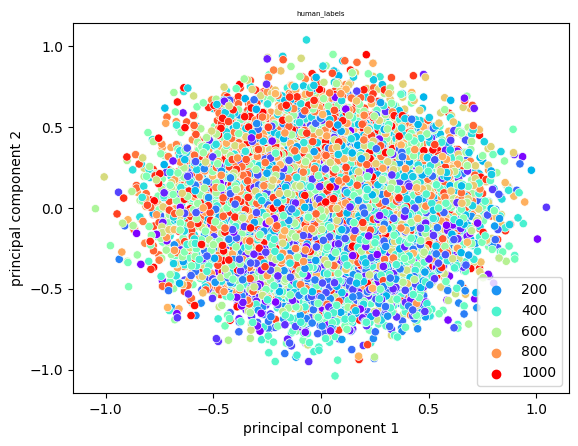

In [4]:
# do PCA
# PCA
n_components = 10
pca = PCA(n_components)

principalComponents = pca.fit_transform(torch.cat(messages))

df_pca = pd.DataFrame(data = principalComponents
            , columns = [f'principal component {i+1}' for i in range(n_components)])
## If we were to reuse those dimensions, this is what they look like : 
# print(df_pca[['principal component 1','principal component 2']].sample(3))

# plotting PCA
prin_comp_A = 1
prin_comp_B = 2
print(len(df_pca[f'principal component {prin_comp_A}']),len(df_pca[f'principal component {prin_comp_B}']),len(labels))
sns.scatterplot(x=df_pca[f'principal component {prin_comp_A}'],
    y=df_pca[f'principal component {prin_comp_B}'], 
    hue = torch.cat(labels),
    palette='rainbow',
).set_title("human_labels", fontsize = 5)

In [5]:
# do normal clustering before PCA, then have PCA, then show.

n_classes =  999


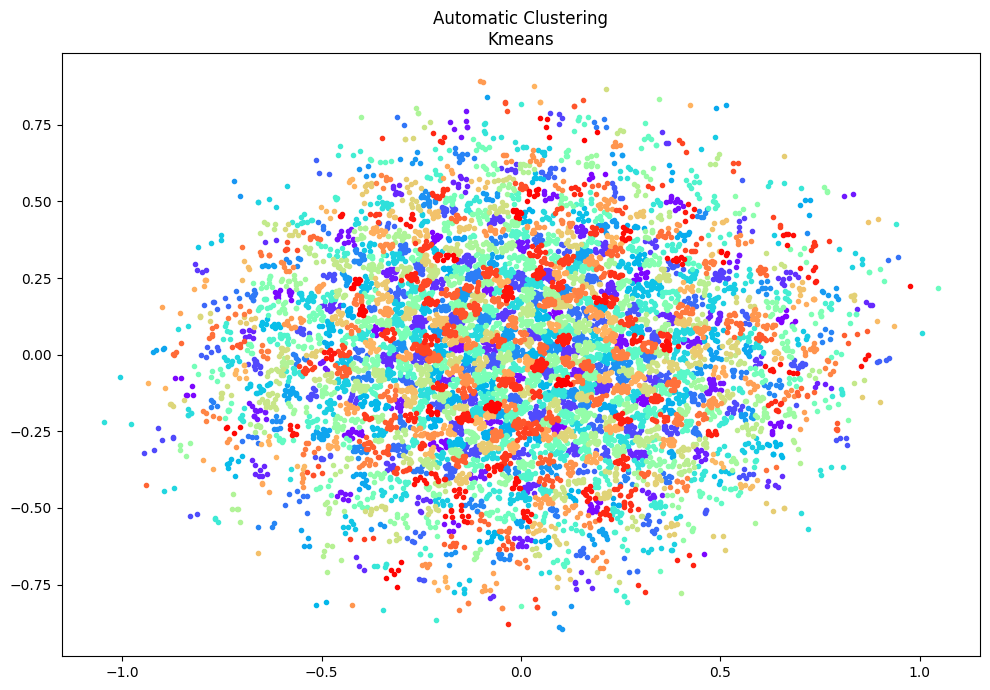

In [6]:
# do clustering
# clustering the PCA
X_pca = df_pca.loc[:,df_pca.columns.str.contains('1' or "2" or "3" or "4")].values
clust2 = KMeans(1000)
clust2.fit(X_pca)

# PLOT
# set colors
color = iter(plt.cm.rainbow(np.linspace(0, 1, max(clust2.labels_))))
# plot figure
plt.figure(figsize=(10, 7))
G = gridspec.GridSpec(1, 1)
ax = plt.subplot(G[0, :])
# ax.plot(space, np.full_like(space, 1.0, dtype=float), "k.", alpha=0.3)
print("n_classes = ",max(clust2.labels_))
colors = plt.cm.get_cmap("hsv", max(clust2.labels_))
for klass in range(max(clust2.labels_)):
    Xk = X_pca[clust2.labels_ == klass]
    c = next(color)
    ax.plot(Xk[:, 0], Xk[:, 1], ".", color=c)
ax.plot(X_pca[clust2.labels_ == -1, 0], X_pca[clust2.labels_ == -1, 1], "k+", alpha=0.1)
ax.set_title("Automatic Clustering\nKmeans")
plt.tight_layout()
plt.show()

In [7]:
# do it again with the human clusters

<__array_function__ internals>:180: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
<__array_function__ internals>:180: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


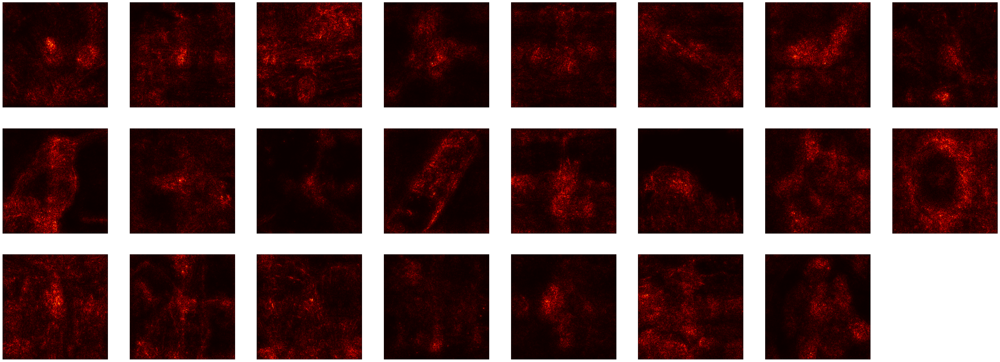

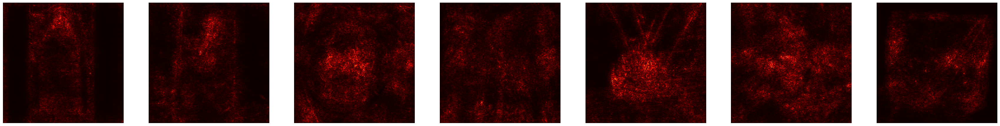

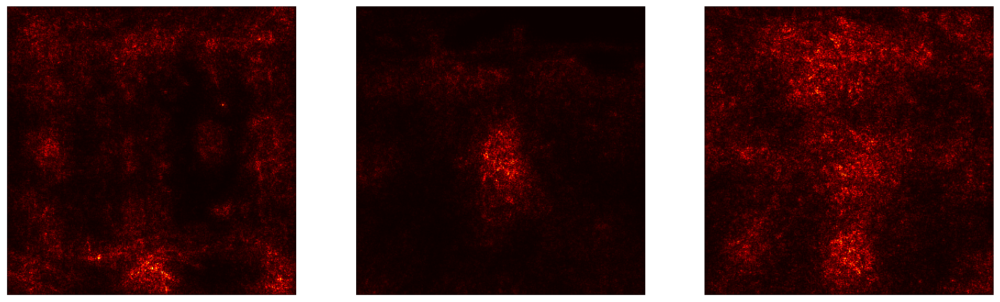

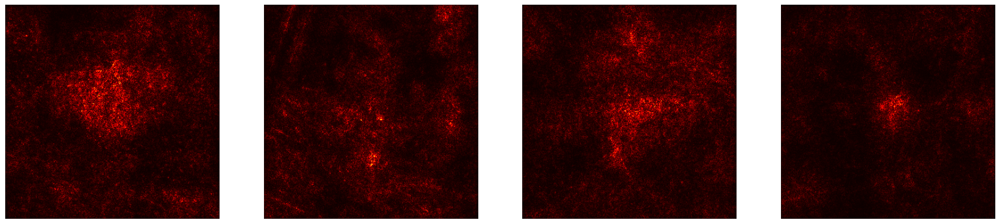

KeyboardInterrupt: 

In [8]:
# show the saliency maps of the chosen clusters

def plot_batch(batch):
    fig = plt.figure(figsize=(50, 50))
    for i,im in enumerate(batch):
        if i > 63:
            print("error, batch seems to be above 64")
            break
        sub = fig.add_subplot(8, 8, i+1)
        plt.imshow(im, cmap='hot')
        plt.axis('off')
    plt.show()
    
for i in range(100,200,5):
    clst_number = i
    plot_batch([np.concatenate(saliencies)[idx][0] for idx in np.where(clust2.labels_ == clst_number)[0]])


In [ ]:
# quick look into the images in the two types of available clusters
# print("portion of kmeans & OPTICS overlap :", (clust.labels_ == clust2.labels_).mean())
clust = clust2
X = X_pca
for i in range(max(clust.labels_)):
    print(f"{len(X[clust.labels_ == i])} images in OPT cluster {i}")
    indexes = np.where(clust.labels_ == i)[0]
    fig = plt.figure(figsize=(10, 10))
#     get images
    images = look_at_image(indexes, df_inter, get_dl(False))

# plot according to distance
    X_temp = X[clust.labels_ == i]
    v = X_temp[:,0]
    X_temp[:,0] = (v - v.min()) / (v.max() - v.min())
    v = X_temp[:,1]
    X_temp[:,1] = (v - v.min()) / (v.max() - v.min())

    plot_image_on_positions(X_temp,images)
    plt.show()

### Travailler sur les réception de messages dans le cluster

In [28]:
# on sélectionne un cluster (ou un centroïde)
clst_number = 3
n_messages = 64
# clust_msgs = torch.cat(messages)[np.where(clust2.labels_ == clst_number)[0]]
# print(clust_msgs)
data_loader = reset_dataloader(opts, n_messages)

# l'envoyer aux receivers
# receivers = [get_models(path)[1] for path in model_paths]
_msg = torch.cat(messages)[:n_messages].to(device)

recv = None
for receiver in get_models(model_paths[0])[1]:
    recv = receiver.to(device)
    break

50000
initialize module resnet152
initialize module dino
initialize module vgg11
initialize module vit
initialize module swin
initialize module inception
['vgg11', 'vit', 'resnet152', 'inception', 'dino', 'swin']
['vgg11', 'vit', 'resnet152', 'inception', 'dino', 'swin']
# loading trainer state from /homedtcl/mmahaut/projects/experiments/im1k_cont/212452/final.tar


In [ ]:
# search best image match in whole dataset
max_sim = torch.tensor([0,0])
best_im = torch.tensor([])
for i,batch in enumerate(data_loader):
    if i < len(clust2.labels_) and clust2.labels_[i] == clst_number:
        im = batch[2]
        im.requires_grad = True
        similarity_scores = recv(_msg, im.to(device)).to("cpu")
        if any([ sc > max_sim.max() for sc in similarity_scores[0]]):
            max_sim = similarity_scores[0]
            best_im = im

tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0]])


In [ ]:
# discretize, then choose image, compute acc
print(n_messages)
labels=torch.Tensor([i for i in range(n_messages)])
for receiver in get_models(model_paths[0])[1]:
    recv = receiver.to(device)
    one_hot_acc = 0
    for i,batch in enumerate(data_loader):
        im = batch[2]
        oh_ss = recv(torch.nn.functional.one_hot(messages[i].argmax(1),16).to(device), im.to(device)).to("cpu")
        if i == 0:
            one_hot_acc = (labels == oh_ss.argmax(dim=0)).float().mean()
        else:
            one_hot_acc = (
                one_hot_acc*(i/(i+1)) 
                + (labels == oh_ss.argmax(dim=0)).float().mean()/(i+1)
            )

        if i + 1 >= len(messages):
            break

    print(one_hot_acc)    

64
initialize module resnet152
initialize module dino
initialize module vgg11
initialize module vit
initialize module swin
initialize module inception
['vgg11', 'vit', 'resnet152', 'inception', 'dino', 'swin']
['vgg11', 'vit', 'resnet152', 'inception', 'dino', 'swin']
# loading trainer state from /homedtcl/mmahaut/projects/experiments/im1k_cont/212452/final.tar
tensor(0.0152)


In [30]:
# quantize, then choose image, compute acc
# one_hot_acc = 0
labels=torch.Tensor([i for i in range(n_messages)])
for receiver in get_models(model_paths[0])[1]:
    recv = receiver.to(device)
    binary_acc = 0
    for i,batch in enumerate(data_loader):
        im = batch[2]
        oh_ss = recv((messages[i] >= 0.3).to(device), im.to(device)).to("cpu")
        if i == 0:
            binary_acc = (labels == oh_ss.argmax(dim=0)).float().mean()
        else:
            binary_acc = (
                binary_acc*(i/(i+1)) 
                + (labels == oh_ss.argmax(dim=0)).float().mean()/(i+1)
            )
#             print(labels,oh_ss,oh_ss.argmax(dim=0),labels == oh_ss.argmax(dim=1))

        if i + 1 >= len(messages):
            break

    print(binary_acc)

initialize module resnet152
initialize module dino
initialize module vgg11
initialize module vit
initialize module swin
initialize module inception
['vgg11', 'vit', 'resnet152', 'inception', 'dino', 'swin']
['vgg11', 'vit', 'resnet152', 'inception', 'dino', 'swin']
# loading trainer state from /homedtcl/mmahaut/projects/experiments/im1k_cont/212452/final.tar
tensor(0.0153)
tensor(0.0152)
tensor(0.0160)
tensor(0.0155)
tensor(0.0157)
tensor(0.0161)


In [31]:
print(max_sim)
# calculate saliency only for best recovered image
max_sim[0].backward(retain_graph=True)
plot_batch(torch.max(best_im.grad.data.abs().to("cpu"), dim=0)[0])
# le receiver reçoit un large panel d'image parmis lesquelles choisir
plt.imshow(best_im[0].detach().numpy().transpose(1, 2, 0))
plt.show()
plt.imshow(best_im[1].detach().numpy().transpose(1, 2, 0))
plt.show()

# on affiche le choix pour le cluster (ou centroïde donné)

# on affiche les saliency choisies

NameError: name 'max_sim' is not defined

In [ ]:
saliencies = [torch.max(sample.grad[i].data.abs().to("cpu"), dim=0)[0] for i in range(0,n_messages)]
print(clust2.labels_[:128])
plot_batch(saliencies)

In [ ]:
clust2.labels_.shape

In [ ]:
# calculer le centroïde d'un cluster
clst_number = 3
centroid = torch.cat(messages)[np.where(clust2.labels_ == clst_number)[0]].mean(dim = 0)
print(centroid)

In [ ]:
similarity_scores